# High-resolution mapping of the neutralizing and binding specificities of polyclonal rabbit serum elicited by HIV trimer immunization 

### Adam S. Dingens, Jesse D. Bloom
### In collaboration with PJ Klasse, John Moore et al. (who provided serum samples and did initial TZM-bl point mutant mapping) and Payal Pratap, Andrew Ward et al. (who performed emPEM). 

We are performing mutational antigenic profiling of BG505 SOSIP trimer vaccinated rabbit serum, provided by John and PJ. We used BG505.T332N mutant Env libraries, first described and characterized in [Haddox, Dingens et al 2018](https://elifesciences.org/articles/34420). The triplicate mutant libraries examined here correspond to the three BG505 replicates in this paper. Replicates annotated with an additional letter (i.e. "rep 1b" or rep "1v2a", with the "v2" refering to the second time raplicate 1 libraries were generated) were done on an indepdent day and have their own mock selected control. 

The _differential selection_ statistic used in this analysis is explained in detail [here](https://jbloomlab.github.io/dms_tools2/diffsel.html).

We use [dms_tools2](https://jbloomlab.github.io/dms_tools2/) to analyze these data. This notebook processes the Illumina deep sequencing data software package, and then analyzes the selection in the context of each sera. Experiments and analysis performed by Adam Dingens in the [Bloom lab](http://research.fhcrc.org/bloom/en.html) in Summer 2019 - Summer 2020. 



## Configure analysis
We first configure the analysis by importing packages and getting information on the samples that we will analyze.

### Import Python modules / packages
Import modules / packages.
In particular, we use:

 - [plotnine](https://plotnine.readthedocs.io) for ggplot2-like plotting syntax
 - [dmslogo](https://jbloomlab.github.io/dmslogo/) to draw sequence logo plots
 - [dms_tools2](https://jbloomlab.github.io/dms_tools2/) for much of the analysis

In [1]:
import itertools
import os
import subprocess
import warnings

from IPython.display import display, HTML

import matplotlib
import matplotlib.pyplot as plt
backend = matplotlib.get_backend()

import numpy

import pandas as pd

from plotnine import *

import yaml

import dmslogo
from dmslogo.colorschemes import AA_CHARGE
from dmslogo.colorschemes import AA_FUNCTIONAL_GROUP

import dms_tools2
from dms_tools2.ipython_utils import showPDF

from dms_variants.constants import CBPALETTE
import dms_variants.plotnine_themes

# needed because dms_tools2 sets backend to pdf
matplotlib.use(backend, force=True)

/fh/fast/bloom_j/software/conda_v2/envs/BloomLab/lib/python3.6/site-packages/dmslogo/logo.py:40: MatplotlibDeprecationWarning: 
The createFontList function was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use FontManager.addfont instead.
  matplotlib.font_manager.findSystemFonts(_FONT_PATH)))


In [2]:
# Set plotnine theme to the gray-grid one defined in dms_variants:

_ = theme_set(dms_variants.plotnine_themes.theme_graygrid())

Turn on interactive matplotlib plotting:

In [3]:
plt.ion()  # turn on interactive plotting

Print versions of Bloom lab software:

In [4]:
print(f"Using dms_tools2 version {dms_tools2.__version__}")
print(f"Using dmslogo version {dmslogo.__version__}")

Using dms_tools2 version 2.6.6
Using dmslogo version 0.3.2


Set data frame display options:

In [5]:
pd.set_option('display.max_colwidth', 200)

Ignore warnings that can clutter notebook:

In [6]:
warnings.simplefilter('ignore')

### Get config variables
Read the variables from the config file.
These variables specify input / output paths and key parameters for analysis:

In [7]:
configfile = 'config.yaml'

with open(configfile) as f:
    config = yaml.safe_load(f)

print(f"Read the following configuration from {configfile}:")
display(HTML(pd.Series(config)
             .to_frame('value')
             .to_html()
             ))

Read the following configuration from config.yaml:


,value
serum_info,data/serum_info.yaml
sample_list,data/sample_list.csv
refseq,data/BG505.W6.C2.T332N_env.fasta
renumbering_scheme,data/BG505_to_HXB2_new.csv
seq_data_source,SRA_accession
fastq_dir,results/FASTQ_files
fastq_dump,fastq-dump
ascp,None
asperakey,None
alignspecs,"87,375,39,36 376,666,36,39 663,954,33,41 955,1228,33,37 1228,1527,34,35 1527,1815,32,39 1816,2098,36,41"


### Get sera information
Read information on the sera that are being mapped.

For each serum sample below, we get:
   - *name*: a more informative name used when displaying results
   - *description*: description of the serum
   - *group*: group of samples to which serum belong, based on preliminary point mutant mapping only
   - *vaccination*:  timing of sera "pre" (wk0) or "post" vaccination
   - *immunogen*: the BG505 SOSIP trimer version used as immunogen, and how many times it was administered
   - *dilution*: the serum dilution used

In [8]:
with open(config['serum_info']) as f:
    Abs = (pd.DataFrame(yaml.safe_load(f))
            .transpose()
            .add_prefix('serum_')
            .rename_axis('serum')
            .reset_index()
            )

assert len(Abs) == len(Abs['serum'].unique()), 'serum not unique'

print(f"Read the following antibody information from {config['serum_info']}:")
display(HTML(Abs.to_html(index=False)))

Read the following antibody information from data/serum_info.yaml:


serum,serum_name,serum_description,serum_group,serum_vaccination,serum_immunogen,serum_dilution
mock,no-antibody,no-antibody control,mock,NaN,NaN,NaN
plasmid,plasmid,plasmid used as control to estimate sequencing error rate,plasmid,NaN,NaN,NaN
BG5-M2E-5724-Wk26-d10,5724-Wk26-d10,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer",C3/465,post,BG505 SOSIP.664 x 4,10
BG5-M2E-5724-Wk26-d30,5724-Wk26-d30,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer",C3/465,post,BG505 SOSIP.664 x 4,30
BG5-M2E-5724-Wk0-d30,5724-Wk0-d30,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer",C3/465,pre,None,30
BG5-M2E-5727-Wk26-d10,5727-Wk26-d10,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer",mainly 465,post,BG505 SOSIP.664 x 4,10
BG5-M2E-5727-Wk0-d10,5727-Wk0-d10,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer",mainly 465,pre,None,10
BG5-M2E-2124-Wk22-d10,2124-Wk22-d10,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer","Weak 241/289 effect, nearly pan-resistant",post,BG505 SOSIP.664 x 3,10
BG5-M2E-2124-Wk22-d30,2124-Wk22-d30,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer","Weak 241/289 effect, nearly pan-resistant",post,BG505 SOSIP.664 x 3,30
BG5-M2E-2124-Wk0-d10,2124-Wk0-d10,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer","Weak 241/289 effect, nearly pan-resistant",pre,None,10


### Get list of samples
Read information about all of the samples that we have deep sequenced.

For each sample, we have information on the serum to which it corresponds, the virus library, the date of sequencing, the serum dilution, the percent infectivity, and (depending on the value of *seq_data_source* in the config file) either the [Sequence Read Archive (SRA)](https://www.ncbi.nlm.nih.gov/sra) accession or the location of the R1 files on the Hutch server:

In [9]:
#import numpy as np
samples = pd.read_csv(config['sample_list'])#, dtype={'rabbit_id':np.int32})


# don't need any R1 column if we are using SRA accession
#if config['seq_data_source'] == 'SRA_accession':
    #samples = samples.drop(columns='R1', errors='ignore')
    
#change R1 location to specify old file location

assert len(samples) == len(samples['sample'].unique()), 'non-unique samples'

print(f"Read the following samples from {config['sample_list']}:")
display(HTML(samples.to_html(index=False)))

Read the following samples from data/sample_list.csv:


sample,rabbit_id,vaccine_status,library,dilution,fraction_surviving,percent_infectivity,R1,SRA_accession
wt-DNA-rep1,NaN,NaN,1,NaN,NaN,NaN,BG505_wt_DNA_rep1_R1.fastq.gz,SRR7693989
wt-DNA-rep2,NaN,NaN,2,NaN,NaN,NaN,BG505_wt_DNA_rep2_R1.fastq.gz,SRR7693998
wt-DNA-rep3,NaN,NaN,3,NaN,NaN,NaN,BG505_wt_DNA_rep3_R1.fastq.gz,SRR7694017
mut-DNA-rep1,NaN,NaN,1,NaN,NaN,NaN,BG505_mut_DNA_rep1_R1.fastq.gz,SRR7693986
mut-DNA-rep2,NaN,NaN,2,NaN,NaN,NaN,BG505_mut_DNA_rep2_R1.fastq.gz,SRR7694002
mut-DNA-rep3,NaN,NaN,3,NaN,NaN,NaN,BG505_mut_DNA_rep3_R1.fastq.gz,SRR7694021
mut-virus-rep2e,NaN,NaN,2e,NaN,0.269024,26.902397,BG505_BG5-M2E-mock_R1.fastq.gz,SRR12431156
mut-virus-rep2e-2124-Wk0-d10,2124.0,pre,2e,10.00,0.090581,9.058139,BG505_BG5-M2E-2124-Wk0-d10_R1.fastq.gz,SRR12431155
mut-virus-rep2e-2124-Wk0-d30,2124.0,pre,2e,30.00,0.243552,24.355172,BG505_BG5-M2E-2124-Wk0-d30_R1.fastq.gz,SRR12431181
mut-virus-rep2e-2124-Wk22-d10,2124.0,post,2e,10.00,0.011684,1.168417,BG505_BG5-M2E-2124-Wk22-d10_R1.fastq.gz,SRR12431170


### Download deep sequencing data

The sequencing data was uploaded to the  as [Bioproject PRJNA656582](https://www.ncbi.nlm.nih.gov/Traces/study/?acc=PRJNA656582&o=acc_s%3Aa), corresponding to runs SRR12431153-SRR12431189. We also dowload previously uploaded and published data for sequencing wtDNA and mutDNA, as specified below. 

The config file specifies whether we get the data from existing *R1* files on the Hutch server, or download the data from the [Sequence Read Archive](https://www.ncbi.nlm.nih.gov/sra) (SRA) using [dms_tools2.sra.fastqFromSRA](https://jbloomlab.github.io/dms_tools2/dms_tools2.sra.html):

In [10]:
if config['seq_data_source'] == 'SRA_accession':
    
    # are we using Aspera for rapid downloads?
    if config['ascp'] and config['asperakey']:
        aspera = (config['ascp'], config['asperakey'])
    else:
        aspera = None
        
    # do the downloads
    print(f"Downloading FASTQ files to {config['fastq_dir']} (takes a while)...")
    os.makedirs(config['fastq_dir'], exist_ok=True)
    samples = samples.rename(columns={'sample': 'name',
                                      'SRA_accession': 'run'})
    dms_tools2.sra.fastqFromSRA(
            samples=samples,
            fastq_dump=config['fastq_dump'],
            fastqdir=config['fastq_dir'],
            aspera=aspera,
            ncpus=config['ncpus'],
            )
    samples = samples.rename(columns={'name': 'sample',
                                      'run': 'SRA_accession'})
    print('Completed downloading files.')
        
elif config['seq_data_source'] != 'R1':
    raise ValueError('invalid value of `seq_data_source`')

INFO:numexpr.utils:Note: NumExpr detected 16 cores but "NUMEXPR_MAX_THREADS" not set, so enforcing safe limit of 8.
INFO:numexpr.utils:NumExpr defaulting to 8 threads.


Completed downloading files.


## Align sequencing and count mutations
The samples were sequenced using [barcoded subamplicon sequencing](https://jbloomlab.github.io/dms_tools2/bcsubamp.html) to obtain high accuracy.
So we need to process these data to determine the counts of each codon mutation in each sample.

First, create the directory used for the results of this part of the analysis:

In [11]:
os.makedirs(config['countsdir'], exist_ok=True)

print(f"Results from counting mutations go to {config['countsdir']}")

Results from counting mutations go to results/codoncounts


### Run `dms2_batch_bcsubamp`
We process the sequencing data by using [dms2_batch_bcsubamp](https://jbloomlab.github.io/dms_tools2/dms2_batch_bcsubamp.html#dms2-batch-bcsubamp) to generate "codon counts" files that give the counts of each codon mutation for each sample.

First, write the batch file used as input by this program:

In [12]:
bcsubamp_batchfile = os.path.join(config['countsdir'], 'batch.csv')

(samples
 .rename(columns={'sample': 'name'})
 [['name', 'R1']]
 .to_csv(bcsubamp_batchfile, index=False)
 )

print(f"Creating batch file {bcsubamp_batchfile}")

Creating batch file results/codoncounts/batch.csv


Now run the program:

In [13]:
cmds = ['dms2_batch_bcsubamp',
        '--batchfile', bcsubamp_batchfile,
        '--refseq', config['refseq'],
        '--alignspecs'] + config['alignspecs'].split() + [
        '--R1trim', str(config['R1trim']),
        '--R2trim', str(config['R2trim']),
        '--outdir', config['countsdir'],
        '--fastqdir', config['fastq_dir'],
        '--summaryprefix', 'summary',
        '--ncpus', str(config['ncpus']),
        '--use_existing', config['use_existing'],
        ]

print(f"Running dms2_batch_bcsubamp with this command:\n{' '.join(cmds)}")
subprocess.check_output(cmds)
print('Completed running dms2_batch_bcsubamp.')

Running dms2_batch_bcsubamp with this command:
dms2_batch_bcsubamp --batchfile results/codoncounts/batch.csv --refseq data/BG505.W6.C2.T332N_env.fasta --alignspecs 87,375,39,36 376,666,36,39 663,954,33,41 955,1228,33,37 1228,1527,34,35 1527,1815,32,39 1816,2098,36,41 --R1trim 200 --R2trim 170 --outdir results/codoncounts --fastqdir results/FASTQ_files --summaryprefix summary --ncpus 16 --use_existing yes
Completed running dms2_batch_bcsubamp.


Confirm that all the expected counts files exist:

In [14]:
assert all(os.path.isfile(f) for f in
           config['countsdir'] + '/' + samples['sample'] + '_codoncounts.csv'
           ), 'missing counts files'

### Plot sequencing and mutation counts summaries
Running [dms2_batch_bcsubamp](https://jbloomlab.github.io/dms_tools2/dms2_batch_bcsubamp.html#dms2-batch-bcsubamp) created some summary plots.
The prefix on those plots should be as follows:

In [15]:
countsplotprefix = os.path.join(config['countsdir'], 'summary_')

#### Reads and barcodes per sample
Total sequencing reads per sample:

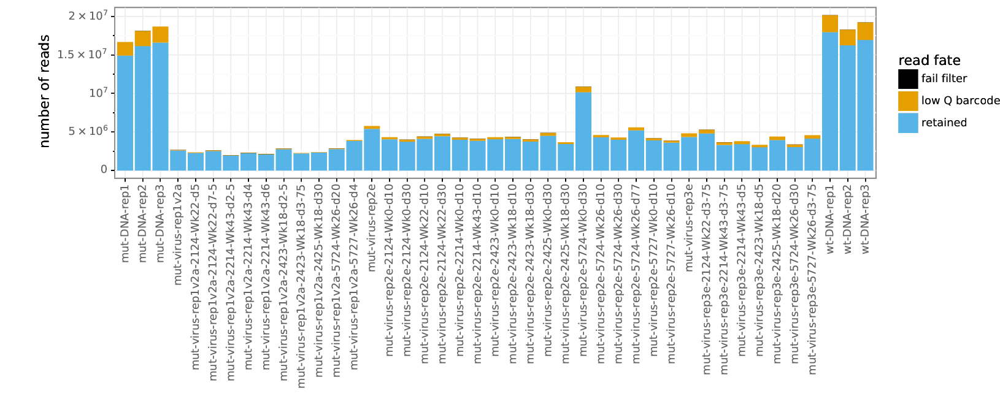

In [16]:
showPDF(countsplotprefix + 'readstats.pdf')

Distribution of sequencing reads per barcode on subamplicons:

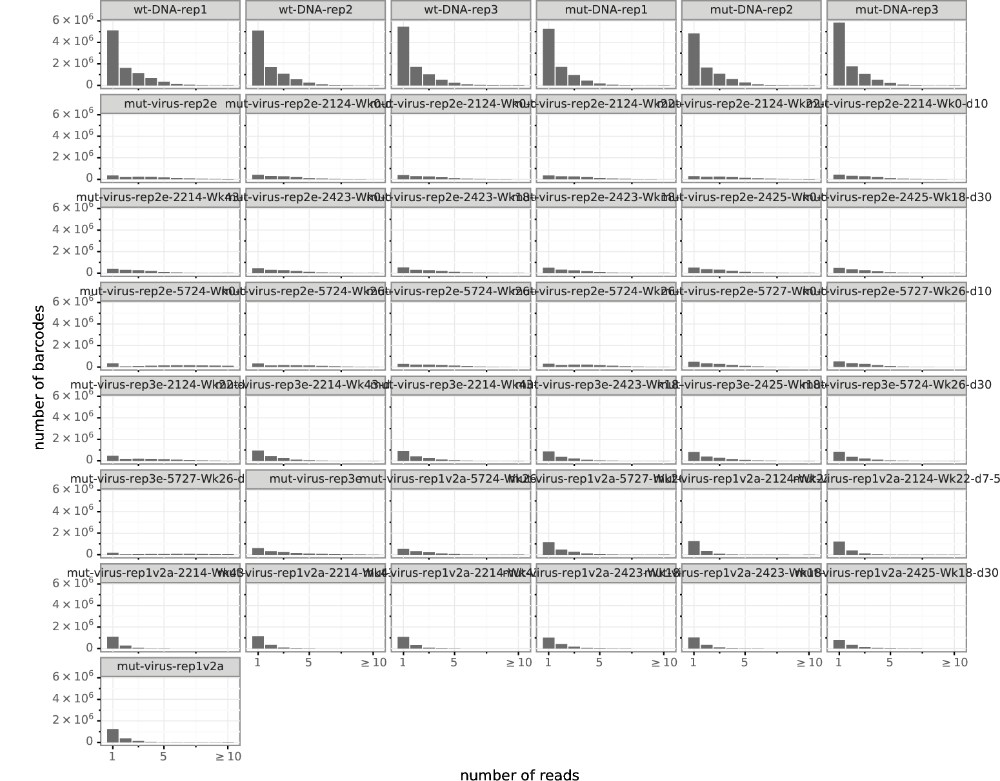

In [17]:
showPDF(countsplotprefix + 'readsperbc.pdf')

Number of barcoded subamplicons that align and have sufficient reads:

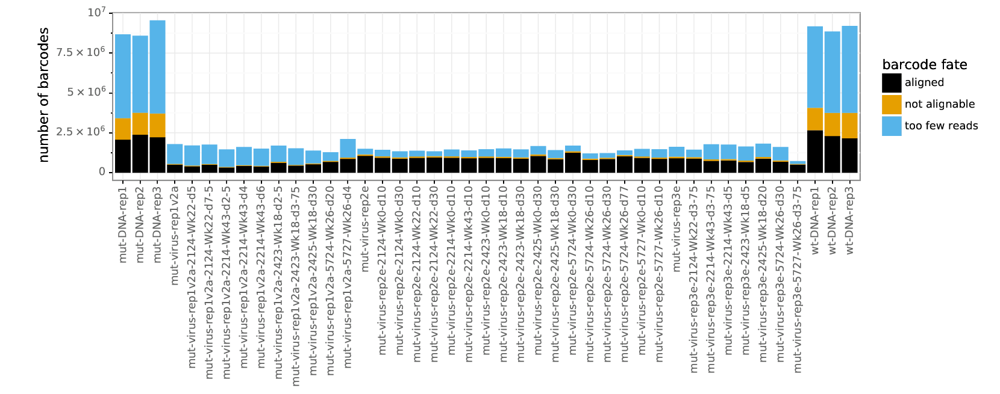

In [18]:
showPDF(countsplotprefix + 'bcstats.pdf')

#### Coverage across gene
Depth of valid barcoded subamplicons covering each site in the gene:

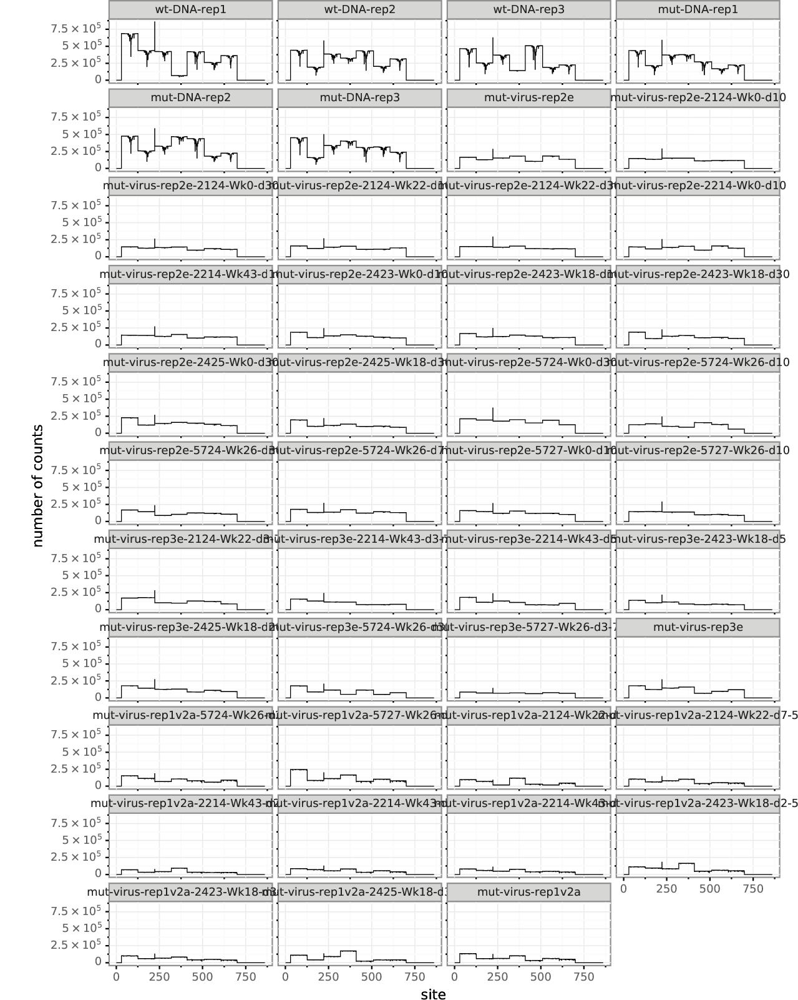

In [19]:
showPDF(countsplotprefix + 'depth.pdf')

#### Mutation frequencies
The average mutation frequency for each sample, stratifying by codon mutation type:

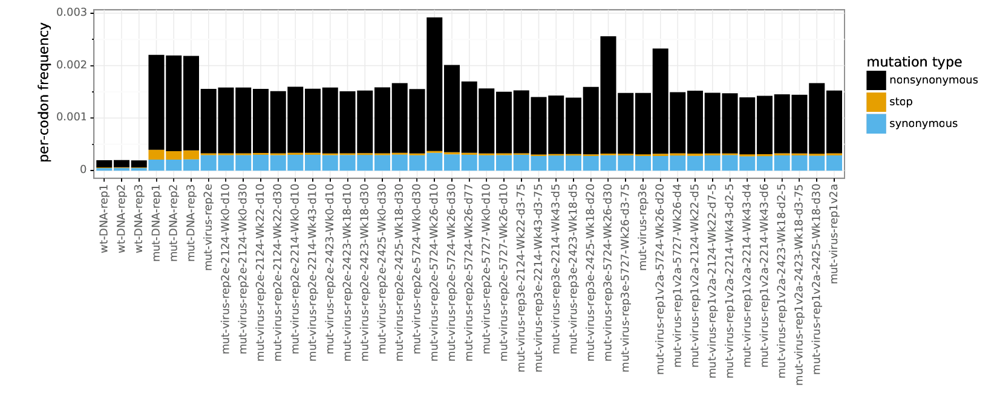

In [20]:
showPDF(countsplotprefix + 'codonmuttypes.pdf')

Average mutation frequency per sample, stratifying by number of nucleotide changes per codon mutation:

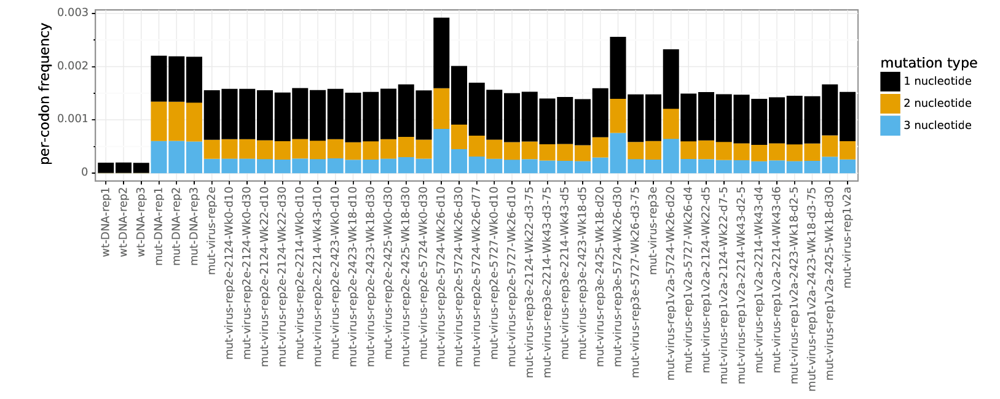

In [21]:
showPDF(countsplotprefix + 'codonntchanges.pdf')

Per-codon mutation frequencies across all sites in gene for each sample:

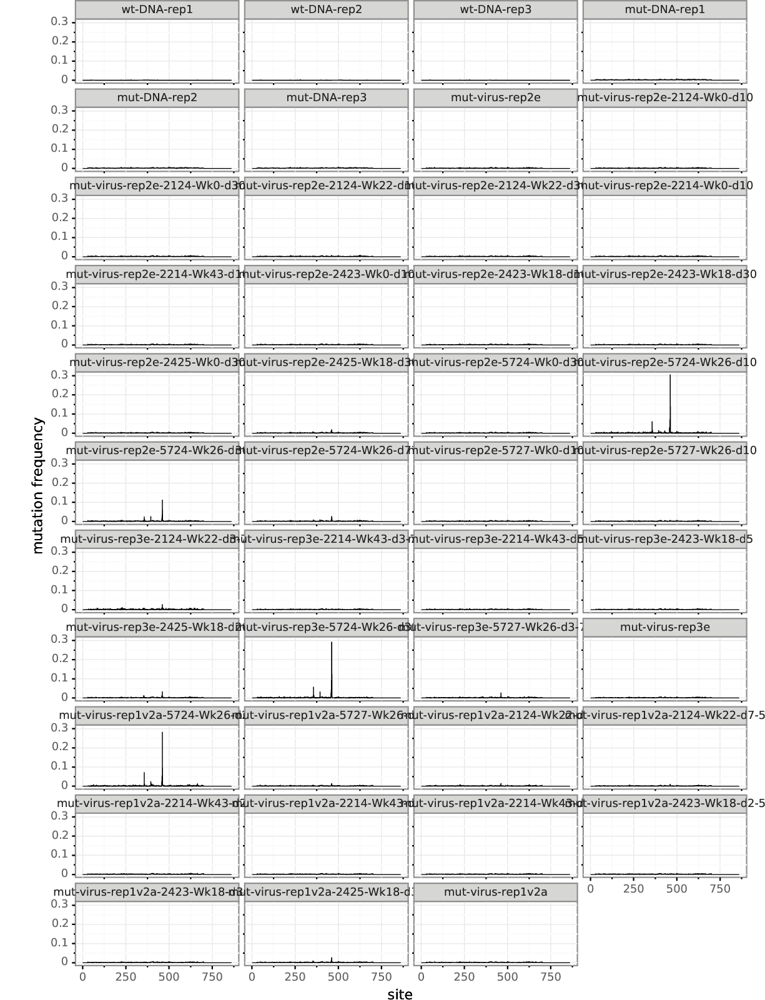

In [22]:
showPDF(countsplotprefix + 'mutfreq.pdf')

#### Check for oxidative damage
Sometimes there is oxidative damage which manifests as an enrichment of `G`->`T` and `C`->`A` mutations among the single-nucleotide codon mutations.
Check for this by plotting frequencies of different single-nucleotide mutation types:

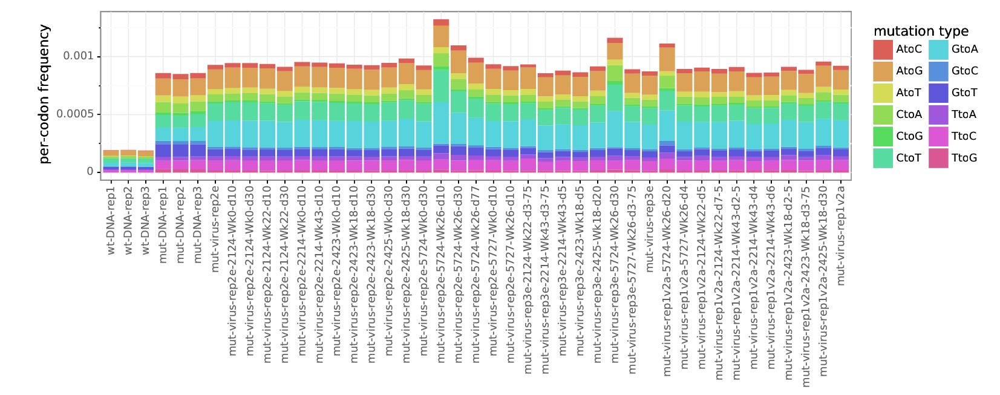

In [23]:
showPDF(countsplotprefix + 'singlentchanges.pdf')

### Renumber to HXB2 Env numbering
The above alignments use sequential 1, 2, ... numbering of the codons.
This is not the standard numbering scheme used for HA, so we use [dms_tools2.utils.renumbSites](https://jbloomlab.github.io/dms_tools2/dms_tools2.utils.html#dms_tools2.utils.renumberSites) to renumber to the standard HA numbering scheme:

In [24]:
dms_tools2.utils.renumberSites(
    renumbfile=config['renumbering_scheme'],
    infiles=list(config['countsdir'] + '/' + samples['sample'] +
                 '_codoncounts.csv'),
    missing='drop',
    outdir=config['renumbcountsdir'])

assert all(os.path.isfile(f) for f in
           config['renumbcountsdir'] + '/' + samples['sample'] +
           '_codoncounts.csv'
           ), 'missing renumbered counts files'

print(f"Renumbered codon counts are in {config['renumbcountsdir']}")

Renumbered codon counts are in results/renumbered_codoncounts


## Compute immune selection on mutations
We will now determine the immune selection on each mutation by comparing its frequency in each serum-selected sample to an appropriate mock-selected control.
Specifically, we will quantify the immune selection as the *differential selection (diffsel)*, which is essentially the log enrichment of each mutation relative to wildtype in the immune-selected versus mock sample.
See [Doud et al (2017)](https://journals.plos.org/plospathogens/article?id=10.1371/journal.ppat.1006271) for the paper introducing this metric, and see [here](https://jbloomlab.github.io/dms_tools2/diffsel.html) for a more detailed description.

In [25]:
Abs["sample"] = Abs["serum"]
Abs["sample"].replace("BG5-M2E-", "mut-virus-rep2e-", regex=True, inplace=True)
Abs["sample"].replace("BG5-M3E-", "mut-virus-rep3e-", regex=True, inplace=True)
Abs["sample"].replace("BG5-M1v2A-", "mut-virus-rep1v2a-", regex=True, inplace=True)
Abs["sample"].replace("BG-M12b-", "mut-virus-rep1v2b-", regex=True, inplace=True)


Now, I will merge the Abs dataframe (containing info from serum_info.yaml) into the samples dataframe (containing the list of samples used for dms_tools processing) into a single datafram called selections. 

In [26]:
selections = (

    # get all immune selected (sel) samples
    samples
    .merge(Abs,left_on='sample', right_on='sample', validate='many_to_one')
    )

In [27]:
tempnames = list(set(selections["rabbit_id"].tolist()))
#tempnames

In [28]:
selections['rabbit_id'] = selections['rabbit_id'].astype(str)
selections['rabbit_id'] = selections['rabbit_id'].str.replace('.0', '')
#selections[rabbit_id] = selections[rabbit_id].fillna(0) # or 0 or any value you want here
#selections[rabbit_id] = selections[rabbit_id].astype(int)
selections

,sample,rabbit_id,vaccine_status,library,dilution,fraction_surviving,percent_infectivity,R1,SRA_accession,R2,serum,serum_name,serum_description,serum_group,serum_vaccination,serum_immunogen,serum_dilution
0,mut-virus-rep2e-2124-Wk0-d10,2124,pre,2e,10.00,0.090581,9.058139,mut-virus-rep2e-2124-Wk0-d10_R1.fastq.gz,SRR12431155,mut-virus-rep2e-2124-Wk0-d10_R2.fastq.gz,BG5-M2E-2124-Wk0-d10,2124-Wk0-d10,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer","Weak 241/289 effect, nearly pan-resistant",pre,None,10
1,mut-virus-rep2e-2124-Wk0-d30,2124,pre,2e,30.00,0.243552,24.355172,mut-virus-rep2e-2124-Wk0-d30_R1.fastq.gz,SRR12431181,mut-virus-rep2e-2124-Wk0-d30_R2.fastq.gz,BG5-M2E-2124-Wk0-d30,2124-Wk0-d30,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer","Weak 241/289 effect, nearly pan-resistant",pre,None,30
2,mut-virus-rep2e-2124-Wk22-d10,2124,post,2e,10.00,0.011684,1.168417,mut-virus-rep2e-2124-Wk22-d10_R1.fastq.gz,SRR12431170,mut-virus-rep2e-2124-Wk22-d10_R2.fastq.gz,BG5-M2E-2124-Wk22-d10,2124-Wk22-d10,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer","Weak 241/289 effect, nearly pan-resistant",post,BG505 SOSIP.664 x 3,10
3,mut-virus-rep2e-2124-Wk22-d30,2124,post,2e,30.00,0.092672,9.267217,mut-virus-rep2e-2124-Wk22-d30_R1.fastq.gz,SRR12431162,mut-virus-rep2e-2124-Wk22-d30_R2.fastq.gz,BG5-M2E-2124-Wk22-d30,2124-Wk22-d30,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer","Weak 241/289 effect, nearly pan-resistant",post,BG505 SOSIP.664 x 3,30
4,mut-virus-rep2e-2214-Wk0-d10,2214,pre,2e,10.00,0.090936,9.093577,mut-virus-rep2e-2214-Wk0-d10_R1.fastq.gz,SRR12431161,mut-virus-rep2e-2214-Wk0-d10_R2.fastq.gz,BG5-M2E-2214-Wk0-d10,2214-Wk0-d10,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer",double epitope cluster,pre,None,10
5,mut-virus-rep2e-2214-Wk43-d10,2214,post,2e,10.00,0.040577,4.057690,mut-virus-rep2e-2214-Wk43-d10_R1.fastq.gz,SRR12431160,mut-virus-rep2e-2214-Wk43-d10_R2.fastq.gz,BG5-M2E-2214-Wk43-d10,2214-Wk43-d10,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer",double epitope cluster,post,BG505 SOSIP.v4.1 x 4,10
6,mut-virus-rep2e-2423-Wk0-d10,2423,pre,2e,10.00,0.099651,9.965059,mut-virus-rep2e-2423-Wk0-d10_R1.fastq.gz,SRR12431159,mut-virus-rep2e-2423-Wk0-d10_R2.fastq.gz,BG5-M2E-2423-Wk0-d10,2423-Wk0-d10,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer",mainly 241/289,pre,None,10
7,mut-virus-rep2e-2423-Wk18-d10,2423,post,2e,10.00,0.029337,2.933714,mut-virus-rep2e-2423-Wk18-d10_R1.fastq.gz,SRR12431158,mut-virus-rep2e-2423-Wk18-d10_R2.fastq.gz,BG5-M2E-2423-Wk18-d10,2423-Wk18-d10,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer",mainly 241/289,post,BG505 SOSIP.v4.1 x 3,10
8,mut-virus-rep2e-2423-Wk18-d30,2423,post,2e,30.00,0.080388,8.038812,mut-virus-rep2e-2423-Wk18-d30_R1.fastq.gz,SRR12431157,mut-virus-rep2e-2423-Wk18-d30_R2.fastq.gz,BG5-M2E-2423-Wk18-d30,2423-Wk18-d30,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer",mainly 241/289,post,BG505 SOSIP.v4.1 x 3,30
9,mut-virus-rep2e-2425-Wk0-d30,2425,pre,2e,30.00,0.297575,29.757478,mut-virus-rep2e-2425-Wk0-d30_R1.fastq.gz,SRR12431154,mut-virus-rep2e-2425-Wk0-d30_R2.fastq.gz,BG5-M2E-2425-Wk0-d30,2425-Wk0-d30,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer",C3/465,pre,None,30


### Samples to compare for each selection
In order to quantify the immune selection, we need to compare each selected sample to the appropriate controls.
Specifically, for each selection, we define three samples:
 - *sel*: the immune-selected sample
 - *mock*: the appropriate mock-selected control for that date and library
 - *err*: the appropriate wildtype plasmid control to estimate sequencing error rates.
 - *group*: groups containing all replicates of specific serum samples (i.e. pre and post samples from the same rabbit are different groups)
  
Below we import this information on the selections:

In [29]:
outdir = config['diffseldir']
os.makedirs(outdir, exist_ok=True)

# write batch file used by program
batchdf = pd.read_csv("./data/diffselbatch.csv")
display(HTML(batchdf.to_html(index=False)))

batchfile = os.path.join(outdir, 'batch.csv')
(batchdf.to_csv(batchfile, index=False)
 )


group,name,sel,mock,err,mds_name
2124-Wk0,rep2e-d10,mut-virus-rep2e-2124-Wk0-d10,mut-virus-rep2e,wt-DNA-rep2,2124-Wk0-rep2e-d10
2124-Wk0,rep2e-d30,mut-virus-rep2e-2124-Wk0-d30,mut-virus-rep2e,wt-DNA-rep2,2124-Wk0-rep2e-d30
2124-Wk22,rep2e-d10,mut-virus-rep2e-2124-Wk22-d10,mut-virus-rep2e,wt-DNA-rep2,2124-Wk22-rep2e-d10
2124-Wk22,rep2e-d30,mut-virus-rep2e-2124-Wk22-d30,mut-virus-rep2e,wt-DNA-rep2,2124-Wk22-rep2e-d30
2214-Wk0,rep2e-d10,mut-virus-rep2e-2214-Wk0-d10,mut-virus-rep2e,wt-DNA-rep2,2214-Wk0-rep2e-d10
2214-Wk43,rep2e-d10,mut-virus-rep2e-2214-Wk43-d10,mut-virus-rep2e,wt-DNA-rep2,2214-Wk43-rep2e-d10
2423-Wk0,rep2e-d10,mut-virus-rep2e-2423-Wk0-d10,mut-virus-rep2e,wt-DNA-rep2,2423-Wk0-rep2e-d10
2423-Wk18,rep2e-d10,mut-virus-rep2e-2423-Wk18-d10,mut-virus-rep2e,wt-DNA-rep2,2423-Wk18-rep2e-d10
2423-Wk18,rep2e-d30,mut-virus-rep2e-2423-Wk18-d30,mut-virus-rep2e,wt-DNA-rep2,2423-Wk18-rep2e-d30
2425-Wk0,rep2e-d30,mut-virus-rep2e-2425-Wk0-d30,mut-virus-rep2e,wt-DNA-rep2,2425-Wk0-rep2e-d30


### Compute immune selection
Now we run [dms2_batch_diffsel](https://jbloomlab.github.io/dms_tools2/dms2_batch_diffsel.html) to compute the immune selection.
We then add to our `selections` data frame the name of the files holding the computed site (*site*) and mutation (*mut*) level selection for each sample.
  
The next cell does all of this:

In [30]:

cmds = ['dms2_batch_diffsel',
        '--summaryprefix', 'summary',
        '--batchfile', batchfile,
        '--outdir', outdir,
        '--indir', config['renumbcountsdir'],
        '--use_existing', "yes", #config['use_existing'],
        '--ncpus', str(config['ncpus'])
        ]

print(f"Computing diffsel using dms2_batch_diffsel with command:\n{' '.join(cmds)}")
subprocess.check_output(cmds)

Computing diffsel using dms2_batch_diffsel with command:
dms2_batch_diffsel --summaryprefix summary --batchfile results/diffsel/batch.csv --outdir results/diffsel --indir results/renumbered_codoncounts --use_existing yes --ncpus 16


b''

In [31]:
#now, I will merge the batchdf into the selections. Note that in the future, I should actually run the diffsel using this file...
selections = selections.merge(batchdf, left_on='sample', right_on='sel')
    
display(HTML(selections.to_html(index=False)))


sample,rabbit_id,vaccine_status,library,dilution,fraction_surviving,percent_infectivity,R1,SRA_accession,R2,serum,serum_name,serum_description,serum_group,serum_vaccination,serum_immunogen,serum_dilution,group,name,sel,mock,err,mds_name
mut-virus-rep2e-2124-Wk0-d10,2124,pre,2e,10.00,0.090581,9.058139,mut-virus-rep2e-2124-Wk0-d10_R1.fastq.gz,SRR12431155,mut-virus-rep2e-2124-Wk0-d10_R2.fastq.gz,BG5-M2E-2124-Wk0-d10,2124-Wk0-d10,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer","Weak 241/289 effect, nearly pan-resistant",pre,None,10,2124-Wk0,rep2e-d10,mut-virus-rep2e-2124-Wk0-d10,mut-virus-rep2e,wt-DNA-rep2,2124-Wk0-rep2e-d10
mut-virus-rep2e-2124-Wk0-d30,2124,pre,2e,30.00,0.243552,24.355172,mut-virus-rep2e-2124-Wk0-d30_R1.fastq.gz,SRR12431181,mut-virus-rep2e-2124-Wk0-d30_R2.fastq.gz,BG5-M2E-2124-Wk0-d30,2124-Wk0-d30,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer","Weak 241/289 effect, nearly pan-resistant",pre,None,30,2124-Wk0,rep2e-d30,mut-virus-rep2e-2124-Wk0-d30,mut-virus-rep2e,wt-DNA-rep2,2124-Wk0-rep2e-d30
mut-virus-rep2e-2124-Wk22-d10,2124,post,2e,10.00,0.011684,1.168417,mut-virus-rep2e-2124-Wk22-d10_R1.fastq.gz,SRR12431170,mut-virus-rep2e-2124-Wk22-d10_R2.fastq.gz,BG5-M2E-2124-Wk22-d10,2124-Wk22-d10,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer","Weak 241/289 effect, nearly pan-resistant",post,BG505 SOSIP.664 x 3,10,2124-Wk22,rep2e-d10,mut-virus-rep2e-2124-Wk22-d10,mut-virus-rep2e,wt-DNA-rep2,2124-Wk22-rep2e-d10
mut-virus-rep2e-2124-Wk22-d30,2124,post,2e,30.00,0.092672,9.267217,mut-virus-rep2e-2124-Wk22-d30_R1.fastq.gz,SRR12431162,mut-virus-rep2e-2124-Wk22-d30_R2.fastq.gz,BG5-M2E-2124-Wk22-d30,2124-Wk22-d30,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer","Weak 241/289 effect, nearly pan-resistant",post,BG505 SOSIP.664 x 3,30,2124-Wk22,rep2e-d30,mut-virus-rep2e-2124-Wk22-d30,mut-virus-rep2e,wt-DNA-rep2,2124-Wk22-rep2e-d30
mut-virus-rep2e-2214-Wk0-d10,2214,pre,2e,10.00,0.090936,9.093577,mut-virus-rep2e-2214-Wk0-d10_R1.fastq.gz,SRR12431161,mut-virus-rep2e-2214-Wk0-d10_R2.fastq.gz,BG5-M2E-2214-Wk0-d10,2214-Wk0-d10,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer",double epitope cluster,pre,None,10,2214-Wk0,rep2e-d10,mut-virus-rep2e-2214-Wk0-d10,mut-virus-rep2e,wt-DNA-rep2,2214-Wk0-rep2e-d10
mut-virus-rep2e-2214-Wk43-d10,2214,post,2e,10.00,0.040577,4.057690,mut-virus-rep2e-2214-Wk43-d10_R1.fastq.gz,SRR12431160,mut-virus-rep2e-2214-Wk43-d10_R2.fastq.gz,BG5-M2E-2214-Wk43-d10,2214-Wk43-d10,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer",double epitope cluster,post,BG505 SOSIP.v4.1 x 4,10,2214-Wk43,rep2e-d10,mut-virus-rep2e-2214-Wk43-d10,mut-virus-rep2e,wt-DNA-rep2,2214-Wk43-rep2e-d10
mut-virus-rep2e-2423-Wk0-d10,2423,pre,2e,10.00,0.099651,9.965059,mut-virus-rep2e-2423-Wk0-d10_R1.fastq.gz,SRR12431159,mut-virus-rep2e-2423-Wk0-d10_R2.fastq.gz,BG5-M2E-2423-Wk0-d10,2423-Wk0-d10,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer",mainly 241/289,pre,None,10,2423-Wk0,rep2e-d10,mut-virus-rep2e-2423-Wk0-d10,mut-virus-rep2e,wt-DNA-rep2,2423-Wk0-rep2e-d10
mut-virus-rep2e-2423-Wk18-d10,2423,post,2e,10.00,0.029337,2.933714,mut-virus-rep2e-2423-Wk18-d10_R1.fastq.gz,SRR12431158,mut-virus-rep2e-2423-Wk18-d10_R2.fastq.gz,BG5-M2E-2423-Wk18-d10,2423-Wk18-d10,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer",mainly 241/289,post,BG505 SOSIP.v4.1 x 3,10,2423-Wk18,rep2e-d10,mut-virus-rep2e-2423-Wk18-d10,mut-virus-rep2e,wt-DNA-rep2,2423-Wk18-rep2e-d10
mut-virus-rep2e-2423-Wk18-d30,2423,post,2e,30.00,0.080388,8.038812,mut-virus-rep2e-2423-Wk18-d30_R1.fastq.gz,SRR12431157,mut-virus-rep2e-2423-Wk18-d30_R2.fastq.gz,BG5-M2E-2423-Wk18-d30,2423-Wk18-d30,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer",mainly 241/289,post,BG505 SOSIP.v4.1 x 3,30,2423-Wk18,rep2e-d30,mut-virus-rep2e-2423-Wk18-d30,mut-virus-rep2e,wt-DNA-rep2,2423-Wk18-rep2e-d30
m

In [32]:
#Now, lets make a figure-like summary table to the selections
selections = selections.sort_values(by=['group', 'dilution', 'library'], ascending=False)
display(selections[['group', 'library', 'dilution', 'percent_infectivity']])

#let's also get avg percent infectivity for each group
display(selections.groupby('group')['percent_infectivity'].mean())


,group,library,dilution,percent_infectivity
16,5727-Wk26,2e,10.00,2.893160
25,5727-Wk26,1v2a,4.00,0.146609
23,5727-Wk26,3e,3.75,0.276168
15,5727-Wk0,2e,10.00,8.952593
14,5724-Wk26,2e,77.00,1.302213
22,5724-Wk26,3e,30.00,0.095505
13,5724-Wk26,2e,30.00,0.187737
24,5724-Wk26,1v2a,20.00,0.016343
12,5724-Wk26,2e,10.00,0.021838
11,5724-Wk0,2e,30.00,19.225925


group
2124-Wk0     16.706656
2124-Wk22     2.192083
2214-Wk0      9.093577
2214-Wk43     1.610619
2423-Wk0      9.965059
2423-Wk18     2.694286
2425-Wk0     29.757478
2425-Wk18     0.946454
5724-Wk0     19.225925
5724-Wk26     0.324727
5727-Wk0      8.952593
5727-Wk26     1.105312
Name: percent_infectivity, dtype: float64

In [33]:
selfilecols = []
for selfile in ['mutdiffsel', 'sitediffsel']:
    selfilecol = selfile + '_file'
    selfilecols.append(selfilecol)
    selections[selfilecol] = ('./' + config['diffseldir'] + '/' + selections['mds_name'] + '_' +
                              selfile + '.csv')
    #print(selections['serum'])
    assert all(selections[selfilecol].map(os.path.isfile)), 'missing files'
    print(f"Created {len(selections[selfilecol])} {selfile} files, adding to "
          f"`selections` data frame in column {selfilecol}")

Created 34 mutdiffsel files, adding to `selections` data frame in column mutdiffsel_file
Created 34 sitediffsel files, adding to `selections` data frame in column sitediffsel_file


### Get all selection information in one data frame

For further processing, we want to create a dataframe that holds all of the selection information at the site and mutation levels for all samples. We create such a dataframe, sel_df, by reading the files in selections into the data frame using dms_tools2.diffsel.df_read_filecols:


In [34]:
sel_df = (dms_tools2.diffsel.df_read_filecols(selections, selfilecols)
          .drop(columns=selfilecols)
          )

Now sel_df is a very large data frame, but it has all the information we want to plot. Here are the first few rows:

In [35]:
print(f"sel_df has {len(sel_df)} rows. Here are the last few:")
display(HTML(sel_df.tail(n=5).to_html(index=False)))

sel_df has 455600 rows. Here are the last few:


sample,rabbit_id,vaccine_status,library,dilution,fraction_surviving,percent_infectivity,R1,SRA_accession,R2,serum,serum_name,serum_description,serum_group,serum_vaccination,serum_immunogen,serum_dilution,group,name,sel,mock,err,mds_name,site,wildtype,mutation,mutdiffsel,abs_diffsel,positive_diffsel,negative_diffsel,max_diffsel,min_diffsel,isite
mut-virus-rep2e-2124-Wk0-d10,2124,pre,2e,10,0.0905814,9.05814,mut-virus-rep2e-2124-Wk0-d10_R1.fastq.gz,SRR12431155,mut-virus-rep2e-2124-Wk0-d10_R2.fastq.gz,BG5-M2E-2124-Wk0-d10,2124-Wk0-d10,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer","Weak 241/289 effect, nearly pan-resistant",pre,None,10,2124-Wk0,rep2e-d10,mut-virus-rep2e-2124-Wk0-d10,mut-virus-rep2e,wt-DNA-rep2,2124-Wk0-rep2e-d10,291,P,E,-0.480176,4.09041,0.015553,-4.074857,0.012587,-1.409012,260
mut-virus-rep2e-2124-Wk0-d10,2124,pre,2e,10,0.0905814,9.05814,mut-virus-rep2e-2124-Wk0-d10_R1.fastq.gz,SRR12431155,mut-virus-rep2e-2124-Wk0-d10_R2.fastq.gz,BG5-M2E-2124-Wk0-d10,2124-Wk0-d10,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer","Weak 241/289 effect, nearly pan-resistant",pre,None,10,2124-Wk0,rep2e-d10,mut-virus-rep2e-2124-Wk0-d10,mut-virus-rep2e,wt-DNA-rep2,2124-Wk0-rep2e-d10,291,P,H,-0.641514,4.09041,0.015553,-4.074857,0.012587,-1.409012,260
mut-virus-rep2e-2124-Wk0-d10,2124,pre,2e,10,0.0905814,9.05814,mut-virus-rep2e-2124-Wk0-d10_R1.fastq.gz,SRR12431155,mut-virus-rep2e-2124-Wk0-d10_R2.fastq.gz,BG5-M2E-2124-Wk0-d10,2124-Wk0-d10,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer","Weak 241/289 effect, nearly pan-resistant",pre,None,10,2124-Wk0,rep2e-d10,mut-virus-rep2e-2124-Wk0-d10,mut-virus-rep2e,wt-DNA-rep2,2124-Wk0-rep2e-d10,291,P,R,-0.771375,4.09041,0.015553,-4.074857,0.012587,-1.409012,260
mut-virus-rep2e-2124-Wk0-d10,2124,pre,2e,10,0.0905814,9.05814,mut-virus-rep2e-2124-Wk0-d10_R1.fastq.gz,SRR12431155,mut-virus-rep2e-2124-Wk0-d10_R2.fastq.gz,BG5-M2E-2124-Wk0-d10,2124-Wk0-d10,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer","Weak 241/289 effect, nearly pan-resistant",pre,None,10,2124-Wk0,rep2e-d10,mut-virus-rep2e-2124-Wk0-d10,mut-virus-rep2e,wt-DNA-rep2,2124-Wk0-rep2e-d10,291,P,L,-1.409012,4.09041,0.015553,-4.074857,0.012587,-1.409012,260
mut-virus-rep2e-2124-Wk0-d10,2124,pre,2e,10,0.0905814,9.05814,mut-virus-rep2e-2124-Wk0-d10_R1.fastq.gz,SRR12431155,mut-virus-rep2e-2124-Wk0-d10_R2.fastq.gz,BG5-M2E-2124-Wk0-d10,2124-Wk0-d10,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer","Weak 241/289 effect, nearly pan-resistant",pre,None,10,2124-Wk0,rep2e-d10,mut-virus-rep2e-2124-Wk0-d10,mut-virus-rep2e,wt-DNA-rep2,2124-Wk0-rep2e-d10,291,P,P,NaN,4.09041,0.015553,-4.074857,0.012587,-1.409012,260



## Analyze and plot immune selection

### Plot site-level selection for all samples

We first plot the site-level selection for all samples. To do this, we look over all sites and use the facet_plot command of dmslogo to plot the site-level selection for all samples for each serum. We also compute the correlation between samples for each serum:

OLD:
sel_df = sel_df.assign(    # add informative names for serum and samples
        serum_name_formatted=lambda x: x['serum_name'],
        name_formatted=lambda x:
            x['library'] + ', ' + x['percent_infectivity'].apply(
                dms_tools2.utils.sigFigStr, nsig=2) + '% infectivity', 
        name=lambda x:
            x['library'] + '-' + x['percent_infectivity'].apply(
                dms_tools2.utils.sigFigStr, nsig=2)
        )


In [36]:
sel_df = sel_df.assign(    # add informative names for serum and samples
        serum_name_formatted=lambda x: x['serum_name'],
        name_formatted=lambda x:
            x['library'] + ', ' + x['percent_infectivity'].apply(
                dms_tools2.utils.sigFigStr, nsig=2) + '% infectivity, ' + "1:" + x["serum_dilution"].apply(
                dms_tools2.utils.sigFigStr, nsig=1) + " serum dilution",  
        name=lambda x:
            x['library'] + '-' + x['percent_infectivity'].apply(
                dms_tools2.utils.sigFigStr, nsig=2)
        )

In [37]:
sel_df["serum_alldils_name"] = (sel_df["rabbit_id"].astype(str) + "_" + sel_df["vaccine_status"].astype(str))
display(HTML(sel_df.head(n=5).to_html(index=False)))

sample,rabbit_id,vaccine_status,library,dilution,fraction_surviving,percent_infectivity,R1,SRA_accession,R2,serum,serum_name,serum_description,serum_group,serum_vaccination,serum_immunogen,serum_dilution,group,name,sel,mock,err,mds_name,site,wildtype,mutation,mutdiffsel,abs_diffsel,positive_diffsel,negative_diffsel,max_diffsel,min_diffsel,isite,serum_name_formatted,name_formatted,serum_alldils_name
mut-virus-rep2e-5727-Wk26-d10,5727,post,2e,10,0.0289316,2.89316,mut-virus-rep2e-5727-Wk26-d10_R1.fastq.gz,SRR12431184,mut-virus-rep2e-5727-Wk26-d10_R2.fastq.gz,BG5-M2E-5727-Wk26-d10,5727-Wk26-d10,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer",mainly 465,post,BG505 SOSIP.664 x 4,10,5727-Wk26,2e-2.9,mut-virus-rep2e-5727-Wk26-d10,mut-virus-rep2e,wt-DNA-rep2,5727-Wk26-rep2e-d10,184f,N,A,2.363613,11.150211,5.616064,-5.534147,2.363613,-1.360174,151,5727-Wk26-d10,"2e, 2.9% infectivity, 1:10 serum dilution",5727_post
mut-virus-rep2e-5727-Wk26-d10,5727,post,2e,10,0.0289316,2.89316,mut-virus-rep2e-5727-Wk26-d10_R1.fastq.gz,SRR12431184,mut-virus-rep2e-5727-Wk26-d10_R2.fastq.gz,BG5-M2E-5727-Wk26-d10,5727-Wk26-d10,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer",mainly 465,post,BG505 SOSIP.664 x 4,10,5727-Wk26,2e-2.9,mut-virus-rep2e-5727-Wk26-d10,mut-virus-rep2e,wt-DNA-rep2,5727-Wk26-rep2e-d10,184f,N,T,0.669328,11.150211,5.616064,-5.534147,2.363613,-1.360174,151,5727-Wk26-d10,"2e, 2.9% infectivity, 1:10 serum dilution",5727_post
mut-virus-rep2e-5727-Wk26-d10,5727,post,2e,10,0.0289316,2.89316,mut-virus-rep2e-5727-Wk26-d10_R1.fastq.gz,SRR12431184,mut-virus-rep2e-5727-Wk26-d10_R2.fastq.gz,BG5-M2E-5727-Wk26-d10,5727-Wk26-d10,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer",mainly 465,post,BG505 SOSIP.664 x 4,10,5727-Wk26,2e-2.9,mut-virus-rep2e-5727-Wk26-d10,mut-virus-rep2e,wt-DNA-rep2,5727-Wk26-rep2e-d10,184f,N,M,0.657208,11.150211,5.616064,-5.534147,2.363613,-1.360174,151,5727-Wk26-d10,"2e, 2.9% infectivity, 1:10 serum dilution",5727_post
mut-virus-rep2e-5727-Wk26-d10,5727,post,2e,10,0.0289316,2.89316,mut-virus-rep2e-5727-Wk26-d10_R1.fastq.gz,SRR12431184,mut-virus-rep2e-5727-Wk26-d10_R2.fastq.gz,BG5-M2E-5727-Wk26-d10,5727-Wk26-d10,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer",mainly 465,post,BG505 SOSIP.664 x 4,10,5727-Wk26,2e-2.9,mut-virus-rep2e-5727-Wk26-d10,mut-virus-rep2e,wt-DNA-rep2,5727-Wk26-rep2e-d10,184f,N,P,0.593790,11.150211,5.616064,-5.534147,2.363613,-1.360174,151,5727-Wk26-d10,"2e, 2.9% infectivity, 1:10 serum dilution",5727_post
mut-virus-rep2e-5727-Wk26-d10,5727,post,2e,10,0.0289316,2.89316,mut-virus-rep2e-5727-Wk26-d10_R1.fastq.gz,SRR12431184,mut-virus-rep2e-5727-Wk26-d10_R2.fastq.gz,BG5-M2E-5727-Wk26-d10,5727-Wk26-d10,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer",mainly 465,post,BG505 SOSIP.664 x 4,10,5727-Wk26,2e-2.9,mut-virus-rep2e-5727-Wk26-d10,mut-virus-rep2e,wt-DNA-rep2,5727-Wk26-rep2e-d10,184f,N,L,0.567204,11.150211,5.616064,-5.534147,2.363613,-1.360174,151,5727-Wk26-d10,"2e, 2.9% infectivity, 1:10 serum dilution",5727_post


#Possible solutions related to matplotlib (have not gotten to work in Bloom Lab environ). 
#matplotlib.use('qt4agg')
import matplotlib
matplotlib.use('tkagg')  # Can also use 'tkagg' or 'webagg'

import matplotlib.pyplot as plt
import seaborn as sns

In [38]:
import seaborn as sns




******************* 2124_post *******************


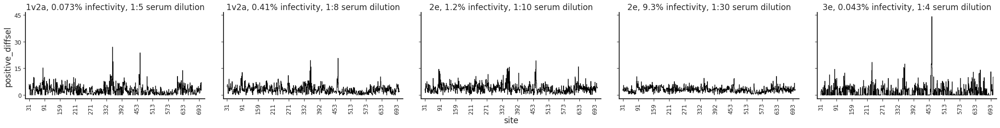

name_formatted,"1v2a, 0.073% infectivity, 1:5 serum dilution","1v2a, 0.41% infectivity, 1:8 serum dilution","2e, 1.2% infectivity, 1:10 serum dilution","2e, 9.3% infectivity, 1:30 serum dilution","3e, 0.043% infectivity, 1:4 serum dilution"
name_formatted,,,,,
"1v2a, 0.073% infectivity, 1:5 serum dilution",1,0.616,0.526,0.435,0.42
"1v2a, 0.41% infectivity, 1:8 serum dilution",0.616,1,0.586,0.535,0.49
"2e, 1.2% infectivity, 1:10 serum dilution",0.526,0.586,1,0.626,0.423
"2e, 9.3% infectivity, 1:30 serum dilution",0.435,0.535,0.626,1,0.325
"3e, 0.043% infectivity, 1:4 serum dilution",0.42,0.49,0.423,0.325,1




******************* 2124_pre *******************


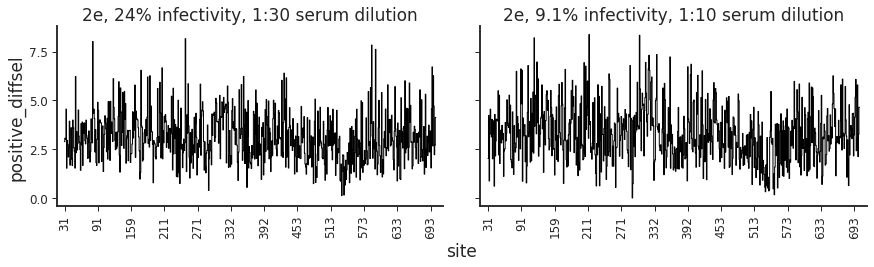

name_formatted,"2e, 24% infectivity, 1:30 serum dilution","2e, 9.1% infectivity, 1:10 serum dilution"
name_formatted,,
"2e, 24% infectivity, 1:30 serum dilution",1,0.521
"2e, 9.1% infectivity, 1:10 serum dilution",0.521,1




******************* 2214_post *******************


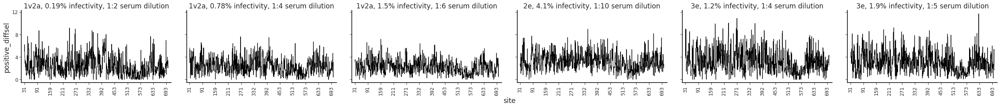

name_formatted,"1v2a, 0.19% infectivity, 1:2 serum dilution","1v2a, 0.78% infectivity, 1:4 serum dilution","1v2a, 1.5% infectivity, 1:6 serum dilution","2e, 4.1% infectivity, 1:10 serum dilution","3e, 1.2% infectivity, 1:4 serum dilution","3e, 1.9% infectivity, 1:5 serum dilution"
name_formatted,,,,,,
"1v2a, 0.19% infectivity, 1:2 serum dilution",1,0.453,0.409,0.36,0.4,0.393
"1v2a, 0.78% infectivity, 1:4 serum dilution",0.453,1,0.431,0.338,0.374,0.377
"1v2a, 1.5% infectivity, 1:6 serum dilution",0.409,0.431,1,0.351,0.428,0.436
"2e, 4.1% infectivity, 1:10 serum dilution",0.36,0.338,0.351,1,0.365,0.371
"3e, 1.2% infectivity, 1:4 serum dilution",0.4,0.374,0.428,0.365,1,0.496
"3e, 1.9% infectivity, 1:5 serum dilution",0.393,0.377,0.436,0.371,0.496,1




******************* 2214_pre *******************


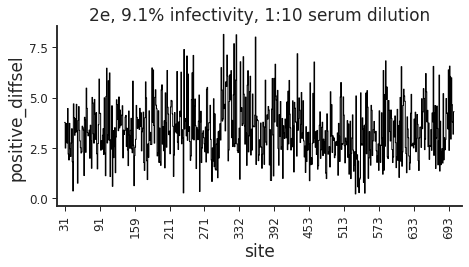

name_formatted,"2e, 9.1% infectivity, 1:10 serum dilution"
name_formatted,
"2e, 9.1% infectivity, 1:10 serum dilution",1




******************* 2423_post *******************


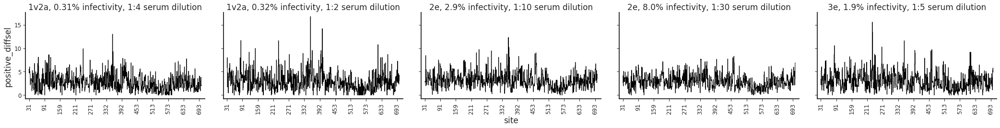

name_formatted,"1v2a, 0.31% infectivity, 1:4 serum dilution","1v2a, 0.32% infectivity, 1:2 serum dilution","2e, 2.9% infectivity, 1:10 serum dilution","2e, 8.0% infectivity, 1:30 serum dilution","3e, 1.9% infectivity, 1:5 serum dilution"
name_formatted,,,,,
"1v2a, 0.31% infectivity, 1:4 serum dilution",1,0.49,0.377,0.323,0.458
"1v2a, 0.32% infectivity, 1:2 serum dilution",0.49,1,0.377,0.353,0.429
"2e, 2.9% infectivity, 1:10 serum dilution",0.377,0.377,1,0.535,0.45
"2e, 8.0% infectivity, 1:30 serum dilution",0.323,0.353,0.535,1,0.396
"3e, 1.9% infectivity, 1:5 serum dilution",0.458,0.429,0.45,0.396,1




******************* 2423_pre *******************


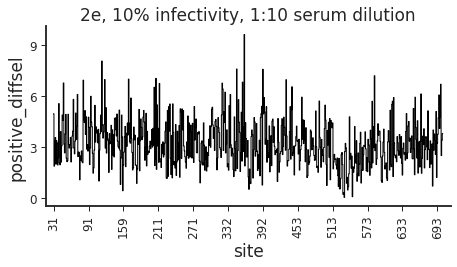

name_formatted,"2e, 10% infectivity, 1:10 serum dilution"
name_formatted,
"2e, 10% infectivity, 1:10 serum dilution",1




******************* 2425_post *******************


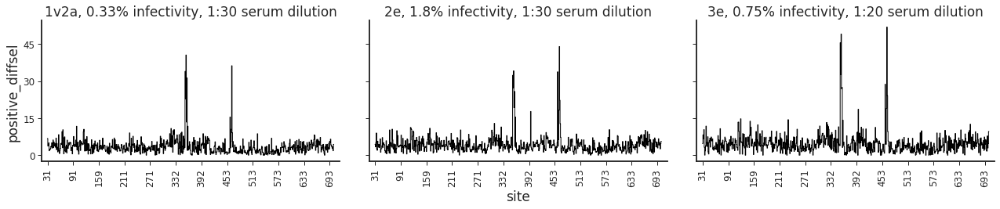

name_formatted,"1v2a, 0.33% infectivity, 1:30 serum dilution","2e, 1.8% infectivity, 1:30 serum dilution","3e, 0.75% infectivity, 1:20 serum dilution"
name_formatted,,,
"1v2a, 0.33% infectivity, 1:30 serum dilution",1,0.753,0.767
"2e, 1.8% infectivity, 1:30 serum dilution",0.753,1,0.812
"3e, 0.75% infectivity, 1:20 serum dilution",0.767,0.812,1




******************* 2425_pre *******************


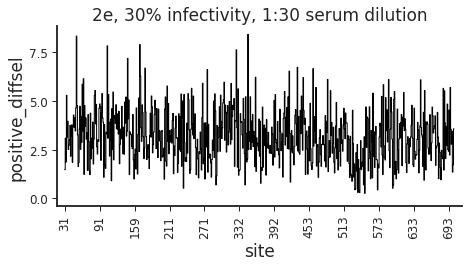

name_formatted,"2e, 30% infectivity, 1:30 serum dilution"
name_formatted,
"2e, 30% infectivity, 1:30 serum dilution",1




******************* 5724_post *******************


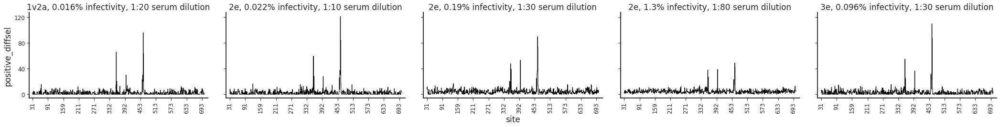

name_formatted,"1v2a, 0.016% infectivity, 1:20 serum dilution","2e, 0.022% infectivity, 1:10 serum dilution","2e, 0.19% infectivity, 1:30 serum dilution","2e, 1.3% infectivity, 1:80 serum dilution","3e, 0.096% infectivity, 1:30 serum dilution"
name_formatted,,,,,
"1v2a, 0.016% infectivity, 1:20 serum dilution",1,0.84,0.798,0.725,0.822
"2e, 0.022% infectivity, 1:10 serum dilution",0.84,1,0.829,0.711,0.86
"2e, 0.19% infectivity, 1:30 serum dilution",0.798,0.829,1,0.798,0.829
"2e, 1.3% infectivity, 1:80 serum dilution",0.725,0.711,0.798,1,0.748
"3e, 0.096% infectivity, 1:30 serum dilution",0.822,0.86,0.829,0.748,1




******************* 5724_pre *******************


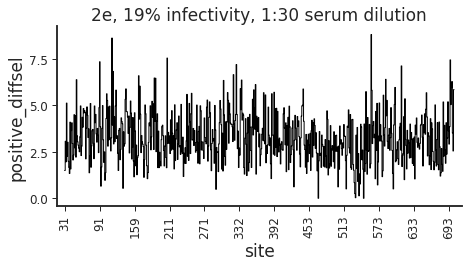

name_formatted,"2e, 19% infectivity, 1:30 serum dilution"
name_formatted,
"2e, 19% infectivity, 1:30 serum dilution",1




******************* 5727_post *******************


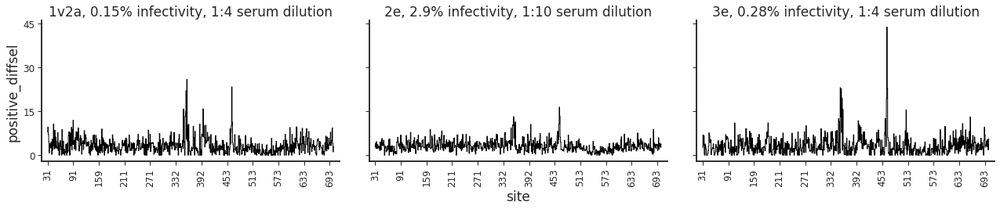

name_formatted,"1v2a, 0.15% infectivity, 1:4 serum dilution","2e, 2.9% infectivity, 1:10 serum dilution","3e, 0.28% infectivity, 1:4 serum dilution"
name_formatted,,,
"1v2a, 0.15% infectivity, 1:4 serum dilution",1,0.456,0.543
"2e, 2.9% infectivity, 1:10 serum dilution",0.456,1,0.535
"3e, 0.28% infectivity, 1:4 serum dilution",0.543,0.535,1




******************* 5727_pre *******************


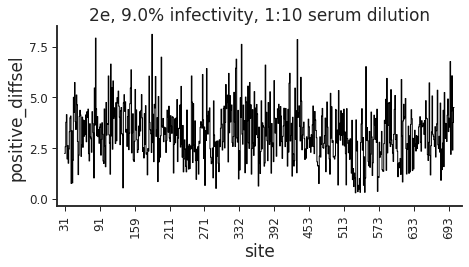

name_formatted,"2e, 9.0% infectivity, 1:10 serum dilution"
name_formatted,
"2e, 9.0% infectivity, 1:10 serum dilution",1


In [39]:
cm = sns.light_palette("green", as_cmap=True)
for serum_name, serum_sel_df in sel_df.groupby('serum_alldils_name'):

    print(f"\n\n******************* {serum_name} *******************")

    fig, ax = dmslogo.facet_plot(
                serum_sel_df,
                x_col='isite',
                gridcol_col='name_formatted',
                show_col=None,
                wspace=0.6,
                draw_line_kwargs=dict(
                        xtick_col='site',
                        height_col='positive_diffsel',
                        ylabel='positive_diffsel',
                        )
                )
    display(fig)
    plt.close(fig)
    serum_sel_df.sort_values('dilution')
    corr_df = (serum_sel_df
               #.rename(columns={'name_formatted': 'sample'})
               .pivot_table(values='positive_diffsel',
                            columns='name_formatted',
                            index=['site'])
               .corr()
               .round(3)
               )
    display(corr_df.style.background_gradient(cmap=cm, low=0, high=1))


### More closely plot the correlation between replicates
Now, I will show the actual correlation plots at the site and mutation level. 


In [40]:
names = batchdf["group"].astype(str)
names = names.tolist()
diffselprefix = "./results/diffsel/summary_"

In [41]:
for seltype in ['mutdiffsel', 'positivesitediffsel']:
    print("\n{0} correlations:".format(seltype))
    plots = []
    for g in names:
        plot = diffselprefix + g + '-' + seltype + 'corr.pdf'
        if os.path.isfile(plot):
            plots.append(plot)
        else:
            print("{0} does not exist.".format(plot))
    showPDF(plots, width=1800)


mutdiffsel correlations:



positivesitediffsel correlations:


In [42]:
sel_df['rabbit_id'] = sel_df['rabbit_id'].astype(int).astype(str)

In [43]:
#We will use axes with shared ylimits across rows for all plots except for the antibody serum group:

share_ylim_across_rows = {serum_group: ('antibody' not in serum_group)
                          for serum_group in sel_df['rabbit_id'].unique()}



In [44]:
#I will by hand decide what sites to zoom in on. These will include both the 241/289 and C3/465 epitopes of interest. 
ZoomSitesList = ["84", "85", "86", "87", "88", "89", "90", "91",  "229", "230", "231", "232", "240","241", "242", "243", "268", "279", "280", "288", "289", "290", "291", "350","351","352", "353", "354", "355", "356", "357", "358", "359", "360", "396", "459", "460", "461", "462", "463", "464", "465", "466", "467", "629"]


In [45]:
#add a column to the sel_df to indicated if the site should be plotted.

sel_df["zoom_site"] = False
sel_df.loc[sel_df['site'].isin(ZoomSitesList), 'zoom_site'] = True
#sel_df

In [46]:
sel_df = sel_df.assign(site_label=lambda x: x['wildtype'] +
                               x['site'].astype('str'))

In [47]:

sel_df["verydiscrip_name"] = (sel_df["serum_alldils_name"].astype(str) + "-vacc, " + sel_df["name_formatted"].astype(str))
display(HTML(sel_df.head(n=5).to_html(index=False)))

sample,rabbit_id,vaccine_status,library,dilution,fraction_surviving,percent_infectivity,R1,SRA_accession,R2,serum,serum_name,serum_description,serum_group,serum_vaccination,serum_immunogen,serum_dilution,group,name,sel,mock,err,mds_name,site,wildtype,mutation,mutdiffsel,abs_diffsel,positive_diffsel,negative_diffsel,max_diffsel,min_diffsel,isite,serum_name_formatted,name_formatted,serum_alldils_name,zoom_site,site_label,verydiscrip_name
mut-virus-rep2e-5727-Wk26-d10,5727,post,2e,10,0.0289316,2.89316,mut-virus-rep2e-5727-Wk26-d10_R1.fastq.gz,SRR12431184,mut-virus-rep2e-5727-Wk26-d10_R2.fastq.gz,BG5-M2E-5727-Wk26-d10,5727-Wk26-d10,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer",mainly 465,post,BG505 SOSIP.664 x 4,10,5727-Wk26,2e-2.9,mut-virus-rep2e-5727-Wk26-d10,mut-virus-rep2e,wt-DNA-rep2,5727-Wk26-rep2e-d10,184f,N,A,2.363613,11.150211,5.616064,-5.534147,2.363613,-1.360174,151,5727-Wk26-d10,"2e, 2.9% infectivity, 1:10 serum dilution",5727_post,False,N184f,"5727_post-vacc, 2e, 2.9% infectivity, 1:10 serum dilution"
mut-virus-rep2e-5727-Wk26-d10,5727,post,2e,10,0.0289316,2.89316,mut-virus-rep2e-5727-Wk26-d10_R1.fastq.gz,SRR12431184,mut-virus-rep2e-5727-Wk26-d10_R2.fastq.gz,BG5-M2E-5727-Wk26-d10,5727-Wk26-d10,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer",mainly 465,post,BG505 SOSIP.664 x 4,10,5727-Wk26,2e-2.9,mut-virus-rep2e-5727-Wk26-d10,mut-virus-rep2e,wt-DNA-rep2,5727-Wk26-rep2e-d10,184f,N,T,0.669328,11.150211,5.616064,-5.534147,2.363613,-1.360174,151,5727-Wk26-d10,"2e, 2.9% infectivity, 1:10 serum dilution",5727_post,False,N184f,"5727_post-vacc, 2e, 2.9% infectivity, 1:10 serum dilution"
mut-virus-rep2e-5727-Wk26-d10,5727,post,2e,10,0.0289316,2.89316,mut-virus-rep2e-5727-Wk26-d10_R1.fastq.gz,SRR12431184,mut-virus-rep2e-5727-Wk26-d10_R2.fastq.gz,BG5-M2E-5727-Wk26-d10,5727-Wk26-d10,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer",mainly 465,post,BG505 SOSIP.664 x 4,10,5727-Wk26,2e-2.9,mut-virus-rep2e-5727-Wk26-d10,mut-virus-rep2e,wt-DNA-rep2,5727-Wk26-rep2e-d10,184f,N,M,0.657208,11.150211,5.616064,-5.534147,2.363613,-1.360174,151,5727-Wk26-d10,"2e, 2.9% infectivity, 1:10 serum dilution",5727_post,False,N184f,"5727_post-vacc, 2e, 2.9% infectivity, 1:10 serum dilution"
mut-virus-rep2e-5727-Wk26-d10,5727,post,2e,10,0.0289316,2.89316,mut-virus-rep2e-5727-Wk26-d10_R1.fastq.gz,SRR12431184,mut-virus-rep2e-5727-Wk26-d10_R2.fastq.gz,BG5-M2E-5727-Wk26-d10,5727-Wk26-d10,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer",mainly 465,post,BG505 SOSIP.664 x 4,10,5727-Wk26,2e-2.9,mut-virus-rep2e-5727-Wk26-d10,mut-virus-rep2e,wt-DNA-rep2,5727-Wk26-rep2e-d10,184f,N,P,0.593790,11.150211,5.616064,-5.534147,2.363613,-1.360174,151,5727-Wk26-d10,"2e, 2.9% infectivity, 1:10 serum dilution",5727_post,False,N184f,"5727_post-vacc, 2e, 2.9% infectivity, 1:10 serum dilution"
mut-virus-rep2e-5727-Wk26-d10,5727,post,2e,10,0.0289316,2.89316,mut-virus-rep2e-5727-Wk26-d10_R1.fastq.gz,SRR12431184,mut-virus-rep2e-5727-Wk26-d10_R2.fastq.gz,BG5-M2E-5727-Wk26-d10,5727-Wk26-d10,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer",mainly 465,post,BG505 SOSIP.664 x 4,10,5727-Wk26,2e-2.9,mut-virus-rep2e-5727-Wk26-d10,mut-virus-rep2e,wt-DNA-rep2,5727-Wk26-rep2e-d10,184f,N,L,0.567204,11.150211,5.616064,-5.534147,2.363613,-1.360174,151,5727-Wk26-d10,"2e, 2.9% infectivity, 1:10 serum dilution",5727_post,False,N184f,"5727_post-vacc, 2e, 2.9% infectivity, 1:10 serum dilution"


In [48]:
sel_df.sort_values('percent_infectivity')

,sample,rabbit_id,vaccine_status,library,dilution,fraction_surviving,percent_infectivity,R1,SRA_accession,R2,...,negative_diffsel,max_diffsel,min_diffsel,isite,serum_name_formatted,name_formatted,serum_alldils_name,zoom_site,site_label,verydiscrip_name
103849,mut-virus-rep1v2a-5724-Wk26-d20,5724,post,1v2a,20,0.000163432,0.0163432,mut-virus-rep1v2a-5724-Wk26-d20_R1.fastq.gz,SRR12431174,mut-virus-rep1v2a-5724-Wk26-d20_R2.fastq.gz,...,-7.262556,0.000000,-1.138427,363,5724-Wk26-d20,"1v2a, 0.016% infectivity, 1:20 serum dilution",5724_post,False,W395,"5724_post-vacc, 1v2a, 0.016% infectivity, 1:20 serum dilution"
98272,mut-virus-rep1v2a-5724-Wk26-d20,5724,post,1v2a,20,0.000163432,0.0163432,mut-virus-rep1v2a-5724-Wk26-d20_R1.fastq.gz,SRR12431174,mut-virus-rep1v2a-5724-Wk26-d20_R2.fastq.gz,...,-16.098995,2.709762,-2.061553,665,5724-Wk26-d20,"1v2a, 0.016% infectivity, 1:20 serum dilution",5724_post,False,V698,"5724_post-vacc, 1v2a, 0.016% infectivity, 1:20 serum dilution"
98271,mut-virus-rep1v2a-5724-Wk26-d20,5724,post,1v2a,20,0.000163432,0.0163432,mut-virus-rep1v2a-5724-Wk26-d20_R1.fastq.gz,SRR12431174,mut-virus-rep1v2a-5724-Wk26-d20_R2.fastq.gz,...,-16.098995,2.709762,-2.061553,665,5724-Wk26-d20,"1v2a, 0.016% infectivity, 1:20 serum dilution",5724_post,False,V698,"5724_post-vacc, 1v2a, 0.016% infectivity, 1:20 serum dilution"
98270,mut-virus-rep1v2a-5724-Wk26-d20,5724,post,1v2a,20,0.000163432,0.0163432,mut-virus-rep1v2a-5724-Wk26-d20_R1.fastq.gz,SRR12431174,mut-virus-rep1v2a-5724-Wk26-d20_R2.fastq.gz,...,-16.098995,2.709762,-2.061553,665,5724-Wk26-d20,"1v2a, 0.016% infectivity, 1:20 serum dilution",5724_post,False,V698,"5724_post-vacc, 1v2a, 0.016% infectivity, 1:20 serum dilution"
98269,mut-virus-rep1v2a-5724-Wk26-d20,5724,post,1v2a,20,0.000163432,0.0163432,mut-virus-rep1v2a-5724-Wk26-d20_R1.fastq.gz,SRR12431174,mut-virus-rep1v2a-5724-Wk26-d20_R2.fastq.gz,...,-16.098995,2.709762,-2.061553,665,5724-Wk26-d20,"1v2a, 0.016% infectivity, 1:20 serum dilution",5724_post,False,V698,"5724_post-vacc, 1v2a, 0.016% infectivity, 1:20 serum dilution"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
178673,mut-virus-rep2e-2425-Wk0-d30,2425,pre,2e,30,0.297575,29.7575,mut-virus-rep2e-2425-Wk0-d30_R1.fastq.gz,SRR12431154,mut-virus-rep2e-2425-Wk0-d30_R2.fastq.gz,...,-1.503803,0.933182,-0.743209,527,2425-Wk0-d30,"2e, 30% infectivity, 1:30 serum dilution",2425_pre,False,E560,"2425_pre-vacc, 2e, 30% infectivity, 1:30 serum dilution"
178674,mut-virus-rep2e-2425-Wk0-d30,2425,pre,2e,30,0.297575,29.7575,mut-virus-rep2e-2425-Wk0-d30_R1.fastq.gz,SRR12431154,mut-virus-rep2e-2425-Wk0-d30_R2.fastq.gz,...,-1.503803,0.933182,-0.743209,527,2425-Wk0-d30,"2e, 30% infectivity, 1:30 serum dilution",2425_pre,False,E560,"2425_pre-vacc, 2e, 30% infectivity, 1:30 serum dilution"
178675,mut-virus-rep2e-2425-Wk0-d30,2425,pre,2e,30,0.297575,29.7575,mut-virus-rep2e-2425-Wk0-d30_R1.fastq.gz,SRR12431154,mut-virus-rep2e-2425-Wk0-d30_R2.fastq.gz,...,-1.503803,0.933182,-0.743209,527,2425-Wk0-d30,"2e, 30% infectivity, 1:30 serum dilution",2425_pre,False,E560,"2425_pre-vacc, 2e, 30% infectivity, 1:30 serum dilution"
178703,mut-virus-rep2e-2425-Wk0-d30,2425,pre,2e,30,0.297575,29.7575,mut-virus-rep2e-2425-Wk0-d30_R1.fastq.gz,SRR12431154,mut-virus-rep2e-2425-Wk0-d30_R2.fastq.gz,...,-1.947949,0.930426,-0.539272,626,2425-Wk0-d30,"2e, 30% infectivity, 1:30 serum dilution",2425_pre,False,D659,"2425_pre-vacc, 2e, 30% infectivity, 1:30 serum dilution"




************************************************************************
Serum group 2124, saving to ./results/diffsel/zoom/2124.pdf



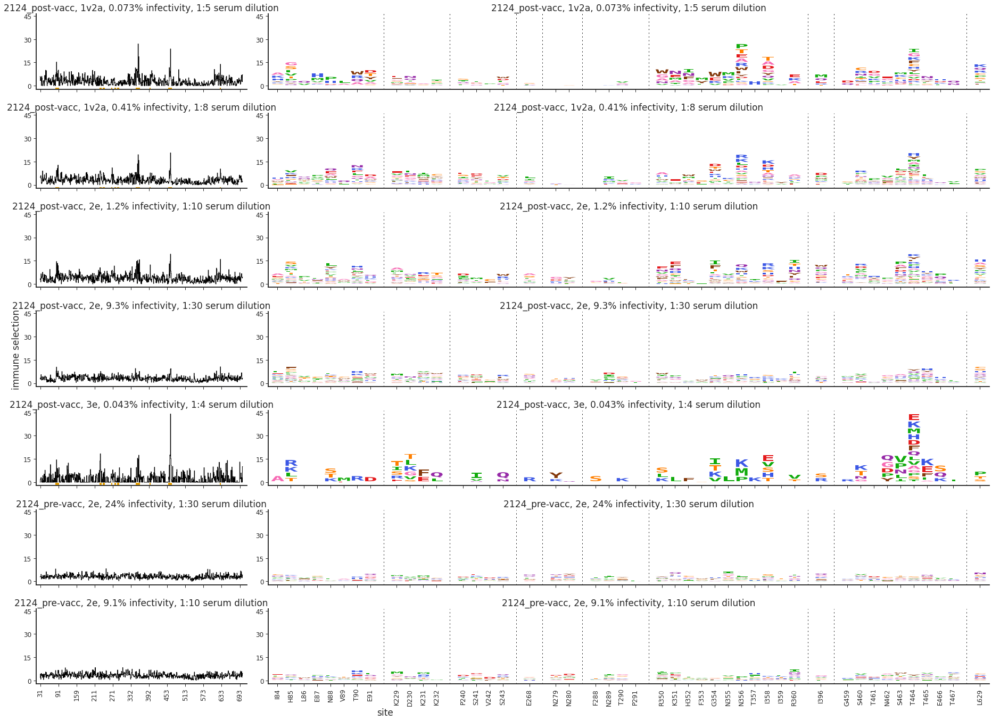



************************************************************************
Serum group 2214, saving to ./results/diffsel/zoom/2214.pdf



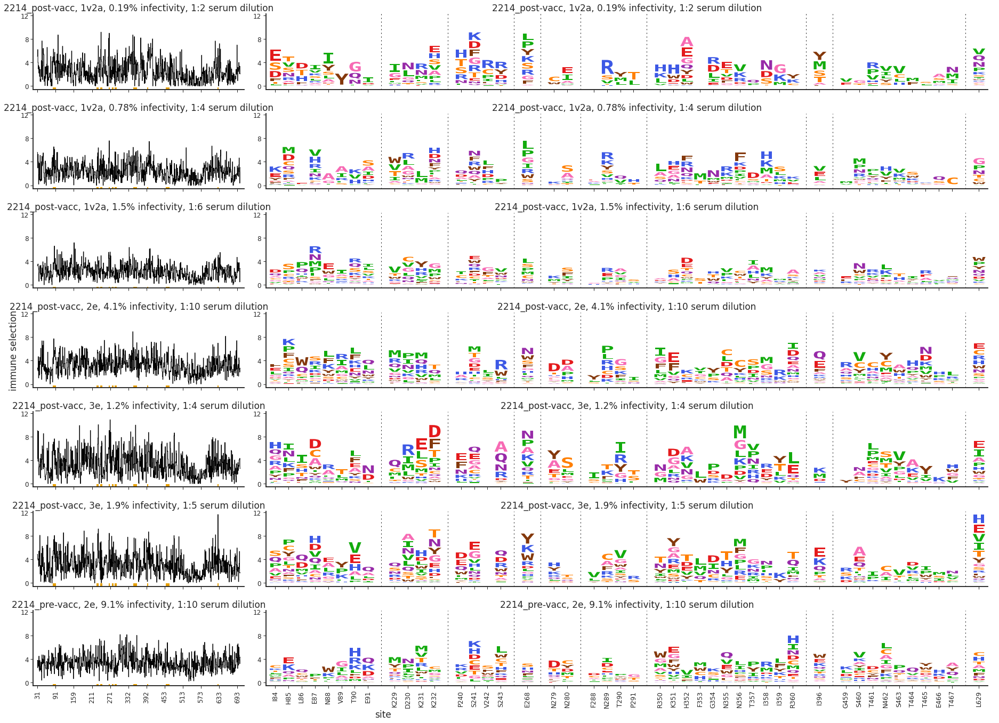



************************************************************************
Serum group 2423, saving to ./results/diffsel/zoom/2423.pdf



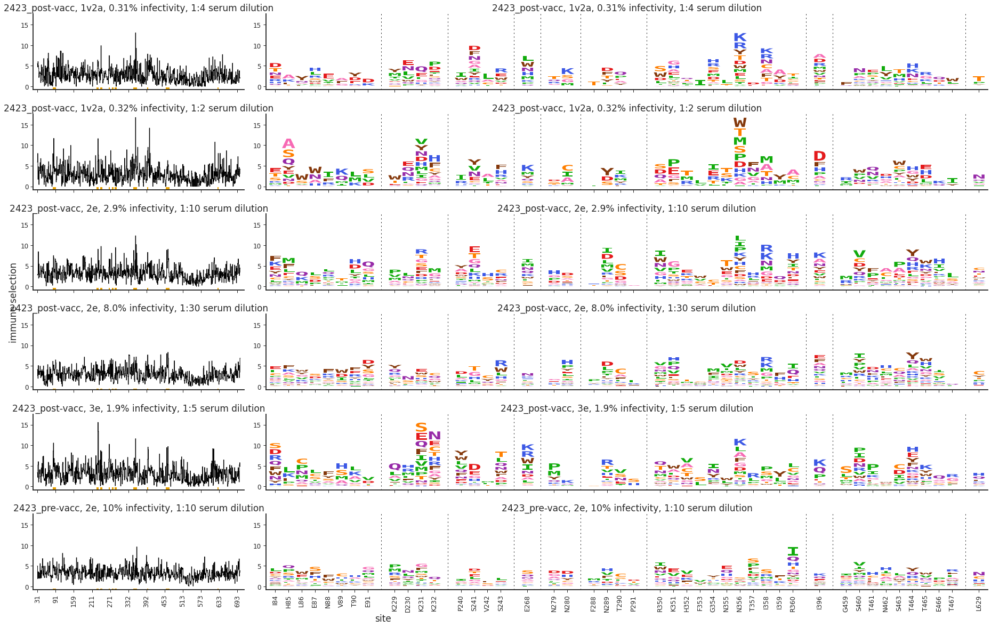



************************************************************************
Serum group 2425, saving to ./results/diffsel/zoom/2425.pdf



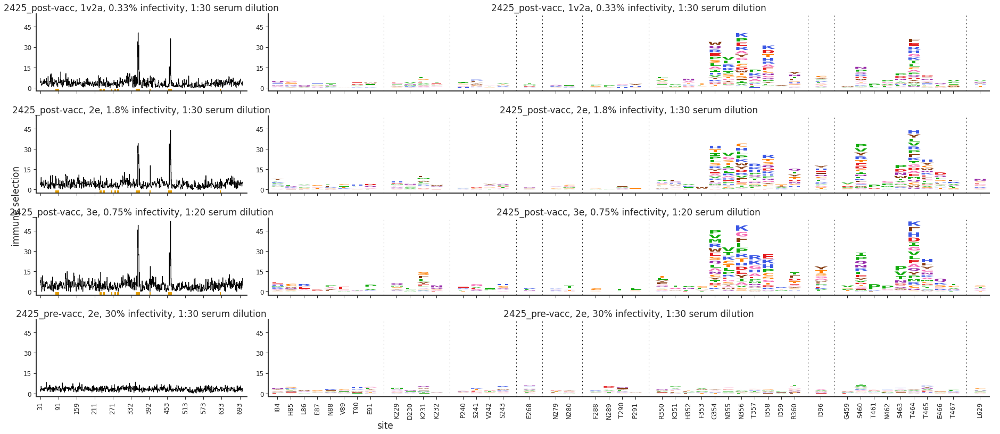



************************************************************************
Serum group 5724, saving to ./results/diffsel/zoom/5724.pdf



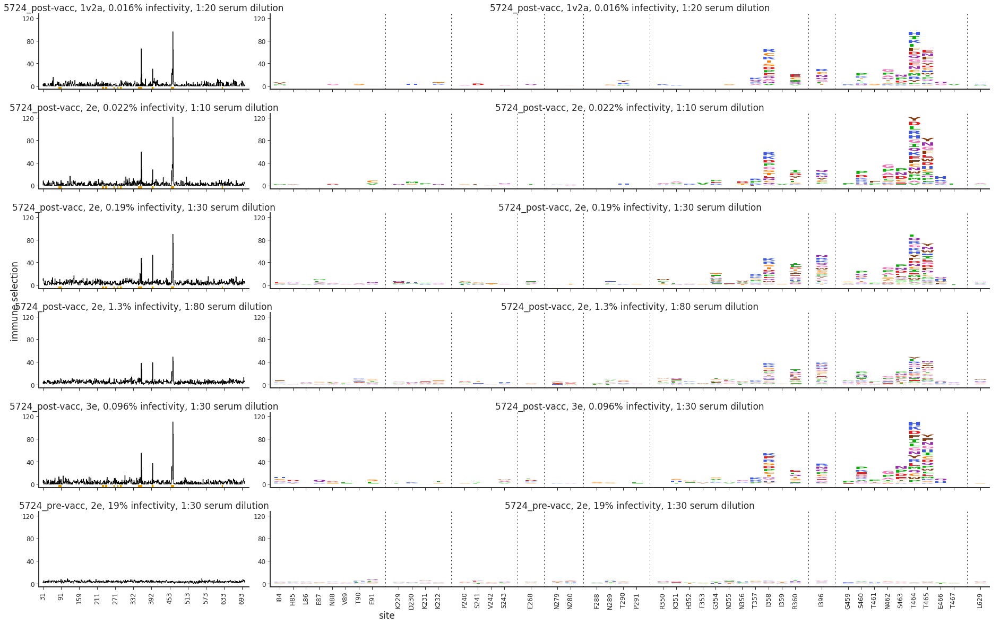



************************************************************************
Serum group 5727, saving to ./results/diffsel/zoom/5727.pdf



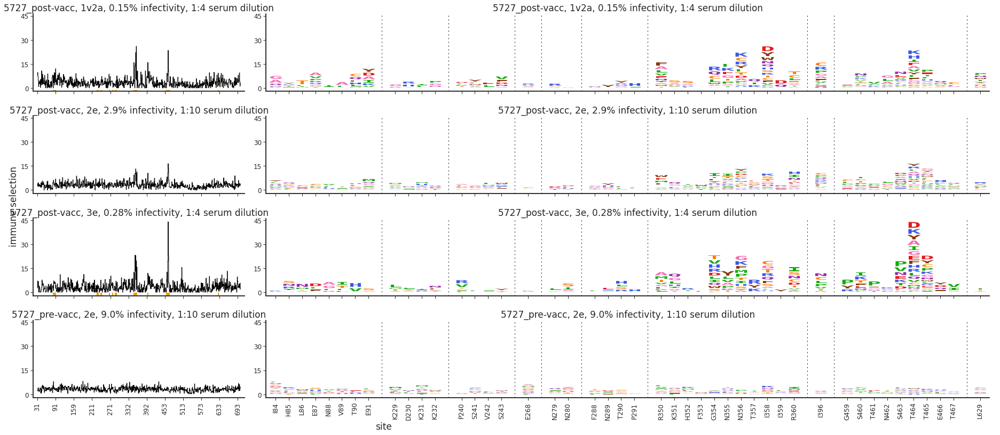

In [49]:
os.makedirs("./results/diffsel/zoom/", exist_ok=True) #"./results/diffsel/zoom/"

for rabbit_id, df in sel_df.groupby('rabbit_id'):

    plotfile = os.path.join("./results/diffsel/zoom/",
                            f"{rabbit_id}.pdf")
    print(f"\n\n{'*' * 72}\nSerum group {rabbit_id}, saving to {plotfile}\n")

    fig, axes = dmslogo.facet_plot(
            data=df,#.query('library == @avg_type'),
            x_col='isite',
            show_col='zoom_site',
            gridrow_col='verydiscrip_name',
            share_xlabel=True,
            share_ylabel=True,
            share_ylim_across_rows=share_ylim_across_rows[rabbit_id],
            wspace=0.6,
            draw_line_kwargs=dict(
                    height_col='positive_diffsel',
                    xtick_col='site',
                    ylabel='immune selection',
                    ),
            draw_logo_kwargs=dict(
                    letter_col='mutation',
                    letter_height_col='mutdiffsel',
                    xtick_col='site_label',
                    xlabel='site',
                    ylabel='immune selection',
                    clip_negative_heights=True,
                    ),
            )
    display(fig)
    fig.savefig(plotfile)
    plt.close(fig)

In [50]:
diffseldir = "./results/diffsel/"

In [51]:
ind_names = list(set(selections["mds_name"].tolist()))
outdir = config['avgdiffsel_full_dir']
os.makedirs(outdir, exist_ok=True)

In [52]:
for antibody in ind_names:
    mutdiffsel = os.path.join(diffseldir, '{0}_mutdiffsel.csv'.format(antibody))
    
    #scale bar unit is maximum effect
    mutdiffseldf = pd.read_csv(mutdiffsel)
    scaleunit = '{0:.1g}'.format(mutdiffseldf['mutdiffsel'].max())
    #print(scaleunit)
    scalelabel = '"differential selection = {0}"'.format(scaleunit)
    logoplot = './results/diffsel/full_logo_plots{0}_diffsel.pdf'.format(antibody)
    #print(logoplot)
    logoname = '{0}'.format(antibody)
    print("\nCreating logo plot for {0} from {1}".format(antibody, mutdiffsel))
    log = !dms2_logoplot \
            --diffsel {mutdiffsel} \
            --name {logoname} \
            --outdir {outdir} \
            --restrictdiffsel positive \
            --sepline no \
            --nperline 84 \
            --overlay1 {mutdiffsel} wildtype wildtype \
            --scalebar {scaleunit} {scalelabel} \
            --underlay yes \
            --use_existing {config['use_existing']}
    #showPDF(logoplot)


Creating logo plot for 2214-Wk43-rep3e-d5 from ./results/diffsel/2214-Wk43-rep3e-d5_mutdiffsel.csv

Creating logo plot for 5724-Wk26-rep2e-d30 from ./results/diffsel/5724-Wk26-rep2e-d30_mutdiffsel.csv

Creating logo plot for 2124-Wk22-rep2e-d10 from ./results/diffsel/2124-Wk22-rep2e-d10_mutdiffsel.csv

Creating logo plot for 5727-Wk26-rep3e-d3-75 from ./results/diffsel/5727-Wk26-rep3e-d3-75_mutdiffsel.csv

Creating logo plot for 2423-Wk18-rep1v2a-d3-75 from ./results/diffsel/2423-Wk18-rep1v2a-d3-75_mutdiffsel.csv

Creating logo plot for 2124-Wk22-rep1v2a-d7-5 from ./results/diffsel/2124-Wk22-rep1v2a-d7-5_mutdiffsel.csv

Creating logo plot for 2425-Wk18-rep3e-d20 from ./results/diffsel/2425-Wk18-rep3e-d20_mutdiffsel.csv

Creating logo plot for 2214-Wk0-rep2e-d10 from ./results/diffsel/2214-Wk0-rep2e-d10_mutdiffsel.csv

Creating logo plot for 5724-Wk0-rep2e-d30 from ./results/diffsel/5724-Wk0-rep2e-d30_mutdiffsel.csv

Creating logo plot for 2214-Wk43-rep1v2a-d6 from ./results/diffsel/22

### Now, plot average data for each sample

In [53]:
groupnames = list(set(batchdf["group"].tolist()))
#groupnames

In [54]:
outdir = config['avgdiffsel_full_dir']
os.makedirs(outdir, exist_ok=True)

In [55]:
#outdir = "./results/diffsel/full_logo_plots/"

In [56]:
for name in groupnames: #groupnames:    
    #scale bar unit is maximum effect
    #print(name)
    med_deffsel_file = "./results/diffsel/summary_{0}-medianmutdiffsel.csv".format(name)
    mutdiffseldf =  pd.read_csv(med_deffsel_file)
    scaleunit = '{0:.1g}'.format(mutdiffseldf['mutdiffsel'].max())
    #print(scaleunit)
    scalelabel = '"differential selection = {0}"'.format(scaleunit)
    logoplot = './results/diffsel/full_logo_plots/median-{0}-diffsel.pdf'.format(name)
    #print(logoplot)
    logoname = 'median-{0}'.format(name)
    print("\nCreating logo plot for {0} from {1}".format(name, med_deffsel_file))
    log = !dms2_logoplot \
            --diffsel {med_deffsel_file} \
            --name {logoname} \
            --outdir {outdir} \
            --restrictdiffsel positive \
            --sepline no \
            --nperline 84 \
            --overlay1 {mutdiffsel} wildtype wildtype \
            --scalebar {scaleunit} {scalelabel} \
            --underlay yes \
            --use_existing {config['use_existing']}



Creating logo plot for 2425-Wk18 from ./results/diffsel/summary_2425-Wk18-medianmutdiffsel.csv

Creating logo plot for 2214-Wk43 from ./results/diffsel/summary_2214-Wk43-medianmutdiffsel.csv

Creating logo plot for 2423-Wk18 from ./results/diffsel/summary_2423-Wk18-medianmutdiffsel.csv

Creating logo plot for 2124-Wk22 from ./results/diffsel/summary_2124-Wk22-medianmutdiffsel.csv

Creating logo plot for 2425-Wk0 from ./results/diffsel/summary_2425-Wk0-medianmutdiffsel.csv

Creating logo plot for 5727-Wk26 from ./results/diffsel/summary_5727-Wk26-medianmutdiffsel.csv

Creating logo plot for 5727-Wk0 from ./results/diffsel/summary_5727-Wk0-medianmutdiffsel.csv

Creating logo plot for 2423-Wk0 from ./results/diffsel/summary_2423-Wk0-medianmutdiffsel.csv

Creating logo plot for 5724-Wk26 from ./results/diffsel/summary_5724-Wk26-medianmutdiffsel.csv

Creating logo plot for 2214-Wk0 from ./results/diffsel/summary_2214-Wk0-medianmutdiffsel.csv

Creating logo plot for 5724-Wk0 from ./results/

Now, we want to make line and logoplots at above but with the avg pre and post  data as above. 
Additionally, we will make the plot the median values on the structure. 



In [57]:
sel_df["serum_alldils_name"] = (sel_df["rabbit_id"].astype(str) + "_" + sel_df["vaccine_status"].astype(str))

display(HTML(sel_df.head(n=5).to_html(index=False)))

sample,rabbit_id,vaccine_status,library,dilution,fraction_surviving,percent_infectivity,R1,SRA_accession,R2,serum,serum_name,serum_description,serum_group,serum_vaccination,serum_immunogen,serum_dilution,group,name,sel,mock,err,mds_name,site,wildtype,mutation,mutdiffsel,abs_diffsel,positive_diffsel,negative_diffsel,max_diffsel,min_diffsel,isite,serum_name_formatted,name_formatted,serum_alldils_name,zoom_site,site_label,verydiscrip_name
mut-virus-rep2e-5727-Wk26-d10,5727,post,2e,10,0.0289316,2.89316,mut-virus-rep2e-5727-Wk26-d10_R1.fastq.gz,SRR12431184,mut-virus-rep2e-5727-Wk26-d10_R2.fastq.gz,BG5-M2E-5727-Wk26-d10,5727-Wk26-d10,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer",mainly 465,post,BG505 SOSIP.664 x 4,10,5727-Wk26,2e-2.9,mut-virus-rep2e-5727-Wk26-d10,mut-virus-rep2e,wt-DNA-rep2,5727-Wk26-rep2e-d10,184f,N,A,2.363613,11.150211,5.616064,-5.534147,2.363613,-1.360174,151,5727-Wk26-d10,"2e, 2.9% infectivity, 1:10 serum dilution",5727_post,False,N184f,"5727_post-vacc, 2e, 2.9% infectivity, 1:10 serum dilution"
mut-virus-rep2e-5727-Wk26-d10,5727,post,2e,10,0.0289316,2.89316,mut-virus-rep2e-5727-Wk26-d10_R1.fastq.gz,SRR12431184,mut-virus-rep2e-5727-Wk26-d10_R2.fastq.gz,BG5-M2E-5727-Wk26-d10,5727-Wk26-d10,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer",mainly 465,post,BG505 SOSIP.664 x 4,10,5727-Wk26,2e-2.9,mut-virus-rep2e-5727-Wk26-d10,mut-virus-rep2e,wt-DNA-rep2,5727-Wk26-rep2e-d10,184f,N,T,0.669328,11.150211,5.616064,-5.534147,2.363613,-1.360174,151,5727-Wk26-d10,"2e, 2.9% infectivity, 1:10 serum dilution",5727_post,False,N184f,"5727_post-vacc, 2e, 2.9% infectivity, 1:10 serum dilution"
mut-virus-rep2e-5727-Wk26-d10,5727,post,2e,10,0.0289316,2.89316,mut-virus-rep2e-5727-Wk26-d10_R1.fastq.gz,SRR12431184,mut-virus-rep2e-5727-Wk26-d10_R2.fastq.gz,BG5-M2E-5727-Wk26-d10,5727-Wk26-d10,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer",mainly 465,post,BG505 SOSIP.664 x 4,10,5727-Wk26,2e-2.9,mut-virus-rep2e-5727-Wk26-d10,mut-virus-rep2e,wt-DNA-rep2,5727-Wk26-rep2e-d10,184f,N,M,0.657208,11.150211,5.616064,-5.534147,2.363613,-1.360174,151,5727-Wk26-d10,"2e, 2.9% infectivity, 1:10 serum dilution",5727_post,False,N184f,"5727_post-vacc, 2e, 2.9% infectivity, 1:10 serum dilution"
mut-virus-rep2e-5727-Wk26-d10,5727,post,2e,10,0.0289316,2.89316,mut-virus-rep2e-5727-Wk26-d10_R1.fastq.gz,SRR12431184,mut-virus-rep2e-5727-Wk26-d10_R2.fastq.gz,BG5-M2E-5727-Wk26-d10,5727-Wk26-d10,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer",mainly 465,post,BG505 SOSIP.664 x 4,10,5727-Wk26,2e-2.9,mut-virus-rep2e-5727-Wk26-d10,mut-virus-rep2e,wt-DNA-rep2,5727-Wk26-rep2e-d10,184f,N,P,0.593790,11.150211,5.616064,-5.534147,2.363613,-1.360174,151,5727-Wk26-d10,"2e, 2.9% infectivity, 1:10 serum dilution",5727_post,False,N184f,"5727_post-vacc, 2e, 2.9% infectivity, 1:10 serum dilution"
mut-virus-rep2e-5727-Wk26-d10,5727,post,2e,10,0.0289316,2.89316,mut-virus-rep2e-5727-Wk26-d10_R1.fastq.gz,SRR12431184,mut-virus-rep2e-5727-Wk26-d10_R2.fastq.gz,BG5-M2E-5727-Wk26-d10,5727-Wk26-d10,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer",mainly 465,post,BG505 SOSIP.664 x 4,10,5727-Wk26,2e-2.9,mut-virus-rep2e-5727-Wk26-d10,mut-virus-rep2e,wt-DNA-rep2,5727-Wk26-rep2e-d10,184f,N,L,0.567204,11.150211,5.616064,-5.534147,2.363613,-1.360174,151,5727-Wk26-d10,"2e, 2.9% infectivity, 1:10 serum dilution",5727_post,False,N184f,"5727_post-vacc, 2e, 2.9% infectivity, 1:10 serum dilution"


In [58]:
selections["serum_alldils_name"] = (selections["rabbit_id"].astype(str) + "_" + selections["vaccine_status"].astype(str))
#display(HTML(selections.head(n=20).to_html(index=False)))



In [59]:
tempnames = list(set(selections["rabbit_id"].tolist()))
tempnames

['5724', '2423', '2425', '5727', '2214', '2124']

In [60]:
avg_selections = selections.copy()
avg_selections.drop(["sample","serum_dilution", "fraction_surviving", "percent_infectivity", "R1", "serum", "serum_name", "name", "sel", "mutdiffsel_file", "sitediffsel_file"], axis=1, inplace=True)
avg_selections = avg_selections.drop_duplicates(subset='serum_alldils_name', keep='first')
avg_selections.head()

,rabbit_id,vaccine_status,library,dilution,SRA_accession,R2,serum_description,serum_group,serum_vaccination,serum_immunogen,group,mock,err,mds_name,serum_alldils_name
16,5727,post,2e,10.0,SRR12431184,mut-virus-rep2e-5727-Wk26-d10_R2.fastq.gz,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer",mainly 465,post,BG505 SOSIP.664 x 4,5727-Wk26,mut-virus-rep2e,wt-DNA-rep2,5727-Wk26-rep2e-d10,5727_post
15,5727,pre,2e,10.0,SRR12431185,mut-virus-rep2e-5727-Wk0-d10_R2.fastq.gz,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer",mainly 465,pre,None,5727-Wk0,mut-virus-rep2e,wt-DNA-rep2,5727-Wk0-rep2e-d10,5727_pre
14,5724,post,2e,77.0,SRR12431186,mut-virus-rep2e-5724-Wk26-d77_R2.fastq.gz,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer",C3/465,post,BG505 SOSIP.664 x 4,5724-Wk26,mut-virus-rep2e,wt-DNA-rep2,5724-Wk26-rep2e-d77,5724_post
11,5724,pre,2e,30.0,SRR12431189,mut-virus-rep2e-5724-Wk0-d30_R2.fastq.gz,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer",C3/465,pre,None,5724-Wk0,mut-virus-rep2e,wt-DNA-rep2,5724-Wk0-rep2e-d30,5724_pre
10,2425,post,2e,30.0,SRR12431153,mut-virus-rep2e-2425-Wk18-d30_R2.fastq.gz,"rabbit sera provided by John Moore. et al, vaccinated with BG505 trimer",C3/465,post,BG505 SOSIP.v4.1 x 3,2425-Wk18,mut-virus-rep2e,wt-DNA-rep2,2425-Wk18-rep2e-d30,2425_post


In [61]:
mediansiteselfiledict={}
medianmutselfiledict = {}
for name in groupnames:
    mediansiteselfiledict[name] = "./results/diffsel/summary_{0}-mediansitediffsel.csv".format(name)
    medianmutselfiledict[name] = "./results/diffsel/summary_{0}-medianmutdiffsel.csv".format(name)

In [62]:
mediansiteselfile_df = pd.DataFrame(list(mediansiteselfiledict.items()), columns=['group','sitediffsel_file'])
medianmutselfile_df = pd.DataFrame(list(medianmutselfiledict.items()), columns=['group','mutdiffsel_file'])
avg_selections = avg_selections.merge(mediansiteselfile_df, left_on='group', right_on='group')
avg_selections = avg_selections.merge(medianmutselfile_df, left_on='group', right_on='group')
#avg_selections



In [63]:
avg_selections['rabbit_id'] = avg_selections['rabbit_id'].astype(str)
share_ylim_across_rows = {serum_group: ('antibody' not in serum_group)
                          for serum_group in avg_selections['rabbit_id'].unique()}

In [64]:
selfilecols = ['mutdiffsel_file', 'sitediffsel_file']
avg_sel_df = (dms_tools2.diffsel.df_read_filecols(avg_selections, selfilecols)
          .drop(columns=selfilecols)
          )

In [65]:
ZoomSitesList = ["84", "85", "86", "87", "88", "89", "90", "91",  "229", "230", "231", "232", "240","241", "242", "243", "268",  "289", "290", "291","347", "350","351","352", "353", "354", "355", "356", "357", "358", "359", "360", "396", "459", "460", "461", "462", "463", "464", "465", "466", "467", "629"]
hole241 = ["84", "85", "86", "87", "88", "89", "90", "91", "229", "230", "231", "232", "240","241", "242", "243", "268", "289", "290", "291", "347", "629"]
c3465 = ["350","351","352", "353", "354", "355", "356", "357", "358", "359", "360", "396", "459", "460", "461", "462", "463", "464", "465", "466", "467"]

avg_sel_df["zoom_site"] = False
avg_sel_df.loc[avg_sel_df['site'].isin(ZoomSitesList), 'zoom_site'] = True

avg_sel_df = avg_sel_df.assign(site_label=lambda x: x['wildtype'] +
                               x['site'].astype('str'))

avg_sel_df["color"] = "gray"
avg_sel_df.loc[avg_sel_df['site'].isin(hole241), 'color'] = "green"
avg_sel_df.loc[avg_sel_df['site'].isin(c3465), 'color'] = "blue"

avg_sel_df.loc[(avg_sel_df['site_label'] == "S241") & (avg_sel_df['mutation'] == "N"), 'color'] = "red"

avg_sel_df.loc[(avg_sel_df['site_label'] == "P291") & (avg_sel_df['mutation'] == "T"), 'color'] = "red"
avg_sel_df.loc[(avg_sel_df['site_label'] == "P291") & (avg_sel_df['mutation'] == "S"), 'color'] = "red"

avg_sel_df.loc[(avg_sel_df['site_label'] == "I358") & (avg_sel_df['mutation'] == "T"), 'color'] = "red"
avg_sel_df.loc[(avg_sel_df['site_label'] == "I358") & (avg_sel_df['mutation'] == "S"), 'color'] = "red"

avg_sel_df.loc[(avg_sel_df['site_label'] == "T465") & (avg_sel_df['mutation'] == "N"), 'color'] = "red"


In [66]:
avg_sel_df["verydiscrip_name"] = (avg_sel_df["group"].astype(str) + "-vacc, TZM-mapped specificity:" + avg_sel_df["serum_group"].astype(str))


In [67]:
#share_ylim_across_rows

In [68]:
plotfile =  "./results/diffsel/AllSamples_SameScaleZoomed.pdf"
fig, axes = dmslogo.facet_plot(
        data=avg_sel_df,#.query('library == @avg_type'),
        x_col='isite',
        show_col='zoom_site',
        gridrow_col='serum_alldils_name',
        share_xlabel=True,
        share_ylabel=True,
        share_ylim_across_rows=False,
        wspace=0.6,
        #
        draw_line_kwargs=dict(
                height_col='positive_diffsel',
                xtick_col='site',
                ylabel='immune selection',
                ),
        draw_logo_kwargs=dict(
                letter_col='mutation',
                letter_height_col='mutdiffsel',
                xtick_col='site_label',
                xlabel='site',
                ylabel='immune selection',
                clip_negative_heights=True,
                ),
        )
#display(fig)
fig.savefig(plotfile)
plt.close(fig)

In [69]:
#plot y scale differently... 
#first, query by each sample the 90th percentile. then make sure y max < than 90th percentile*10, then set y max to 90th percentile*10

In [70]:
nintiethpercentile_dict = avg_sel_df.groupby("group").positive_diffsel.quantile(.9)
nintiethpercentile_x10_dict = {}
nintiethpercentile_x5_dict = {}
for name in groupnames:
    nintiethpercentile_x10_dict[name] = nintiethpercentile_dict[name] * 10
    nintiethpercentile_x5_dict[name] = nintiethpercentile_dict[name] * 5
nintiethpercentile_x10_dict
nintiethpercentile_x5_dict

{'2425-Wk18': 22.249096172909365,
 '2214-Wk43': 9.878864910529261,
 '2423-Wk18': 12.639323538979419,
 '2124-Wk22': 10.135132682824901,
 '2425-Wk0': 25.15709769655093,
 '5727-Wk26': 15.60611663013917,
 '5727-Wk0': 23.897234808593918,
 '2423-Wk0': 25.265879537033044,
 '5724-Wk26': 6.781270354878424,
 '2214-Wk0': 26.448687302988468,
 '5724-Wk0': 24.985849175960922,
 '2124-Wk0': 21.96547092372635}

In [71]:
max_dict = avg_sel_df.groupby("group").positive_diffsel.quantile(1)
max_dict

group
2124-Wk0       7.052694
2124-Wk22     19.272802
2214-Wk0       8.133172
2214-Wk43      5.116609
2423-Wk0       9.609191
2423-Wk18      9.029074
2425-Wk0       8.415448
2425-Wk18     44.226667
5724-Wk0       8.809110
5724-Wk26    100.434107
5727-Wk0       8.110198
5727-Wk26     27.611616
Name: positive_diffsel, dtype: float64

In [72]:
ymax_dict = {}
ymaxx5_dict = {}
for name in groupnames:
    ymax_dict[name] = max(max_dict[name] * 1.055, nintiethpercentile_x10_dict[name])
    ymaxx5_dict[name] = max(max_dict[name] * 1.055, nintiethpercentile_x5_dict[name])

In [73]:
for name in groupnames:
    print("\n",name)
    print("max value is:\n", max_dict[name])
    print("90th percentilex10 is \n", nintiethpercentile_x10_dict[name])
    print("used y max value is \n", ymax_dict[name])


 2425-Wk18
max value is:
 44.22666682216751
90th percentilex10 is 
 44.49819234581873
used y max value is 
 46.65913349738672

 2214-Wk43
max value is:
 5.116609063991265
90th percentilex10 is 
 19.757729821058522
used y max value is 
 19.757729821058522

 2423-Wk18
max value is:
 9.02907422319424
90th percentilex10 is 
 25.278647077958837
used y max value is 
 25.278647077958837

 2124-Wk22
max value is:
 19.27280224063353
90th percentilex10 is 
 20.270265365649802
used y max value is 
 20.332806363868375

 2425-Wk0
max value is:
 8.415447990073734
90th percentilex10 is 
 50.31419539310186
used y max value is 
 50.31419539310186

 5727-Wk26
max value is:
 27.611616159638906
90th percentilex10 is 
 31.21223326027834
used y max value is 
 31.21223326027834

 5727-Wk0
max value is:
 8.110197806393593
90th percentilex10 is 
 47.794469617187836
used y max value is 
 47.794469617187836

 2423-Wk0
max value is:
 9.609191056682972
90th percentilex10 is 
 50.53175907406609
used y max value is

In [74]:
rabbit_post_ymax_dict = ymax_dict.copy()

rabbit_post_ymax_dict["2124"] = rabbit_post_ymax_dict.pop("2124-Wk22")
rabbit_post_ymax_dict["2214"] = rabbit_post_ymax_dict.pop("2214-Wk43")
rabbit_post_ymax_dict["5724"] = rabbit_post_ymax_dict.pop("5724-Wk26")
rabbit_post_ymax_dict["5727"] = rabbit_post_ymax_dict.pop("5727-Wk26")
rabbit_post_ymax_dict["2425"] = rabbit_post_ymax_dict.pop("2425-Wk18")
rabbit_post_ymax_dict["2423"] = rabbit_post_ymax_dict.pop("2423-Wk18")
#rabbit_post_ymax_dict

In [75]:

rabbit_post_ymaxx5_dict = ymaxx5_dict.copy()

rabbit_post_ymaxx5_dict["2124"] = rabbit_post_ymaxx5_dict.pop("2124-Wk22")
rabbit_post_ymaxx5_dict["2214"] = rabbit_post_ymaxx5_dict.pop("2214-Wk43")
rabbit_post_ymaxx5_dict["5724"] = rabbit_post_ymaxx5_dict.pop("5724-Wk26")
rabbit_post_ymaxx5_dict["5727"] = rabbit_post_ymaxx5_dict.pop("5727-Wk26")
rabbit_post_ymaxx5_dict["2425"] = rabbit_post_ymaxx5_dict.pop("2425-Wk18")
rabbit_post_ymaxx5_dict["2423"] = rabbit_post_ymaxx5_dict.pop("2423-Wk18")
#rabbit_post_ymaxx5_dict

In [76]:
#rabbit_post_ymax_dict

In [77]:
rabbitnames = list(set(avg_sel_df["rabbit_id"].tolist()))
#rabbitnames

2124
20.332806363868375


************************************************************************
Serum group 2124, saving to ./results/diffsel/AvgAcrossDils/2124.pdf



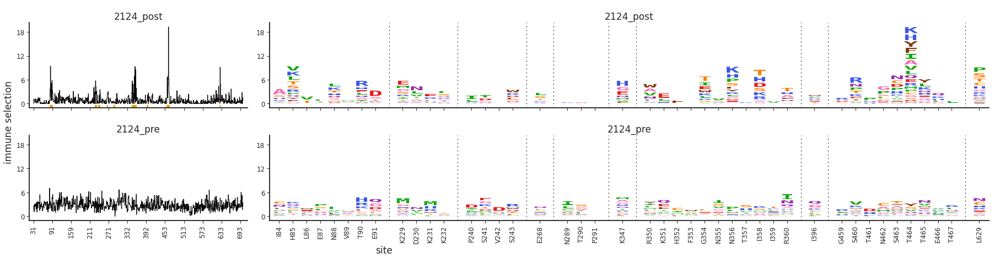

2214
19.757729821058522


************************************************************************
Serum group 2214, saving to ./results/diffsel/AvgAcrossDils/2214.pdf



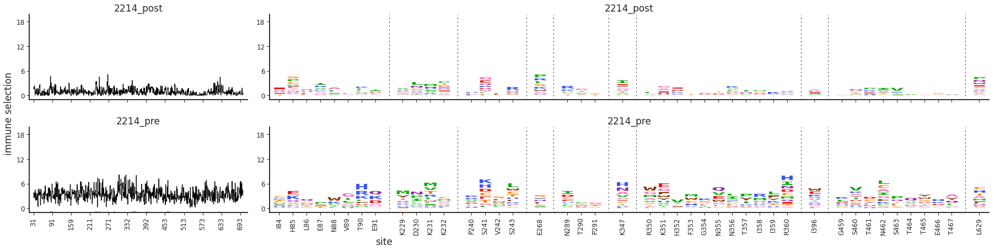

2423
25.278647077958837


************************************************************************
Serum group 2423, saving to ./results/diffsel/AvgAcrossDils/2423.pdf



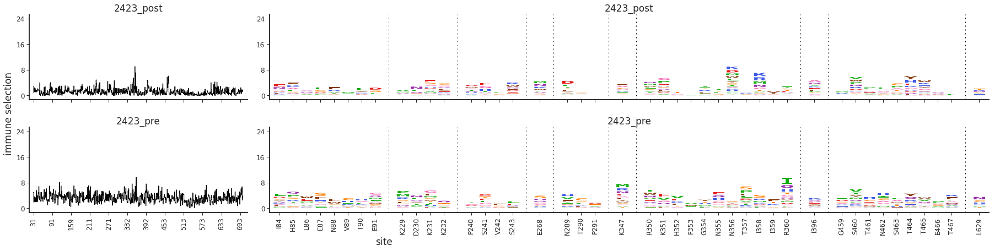

2425
46.65913349738672


************************************************************************
Serum group 2425, saving to ./results/diffsel/AvgAcrossDils/2425.pdf



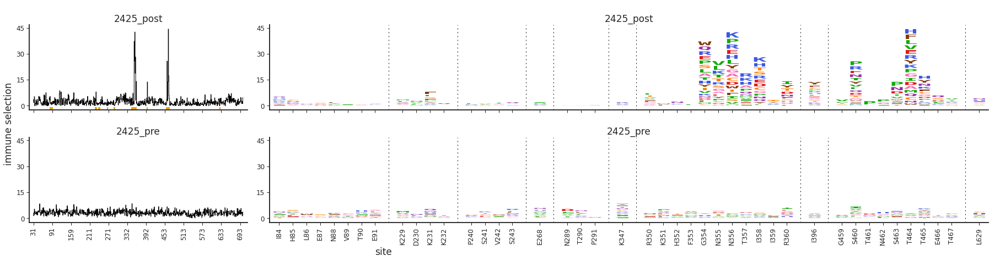

5724
105.95798337522064


************************************************************************
Serum group 5724, saving to ./results/diffsel/AvgAcrossDils/5724.pdf



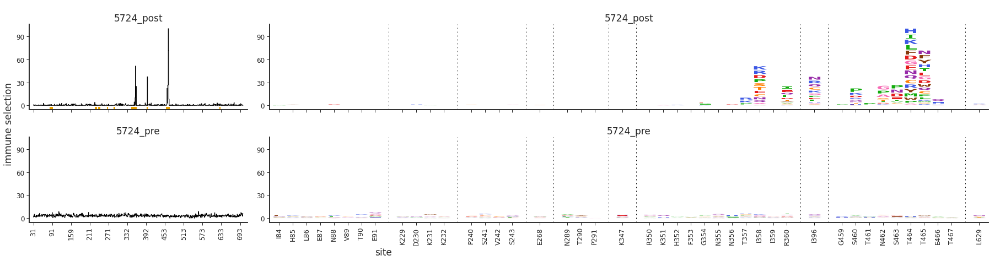

5727
31.21223326027834


************************************************************************
Serum group 5727, saving to ./results/diffsel/AvgAcrossDils/5727.pdf



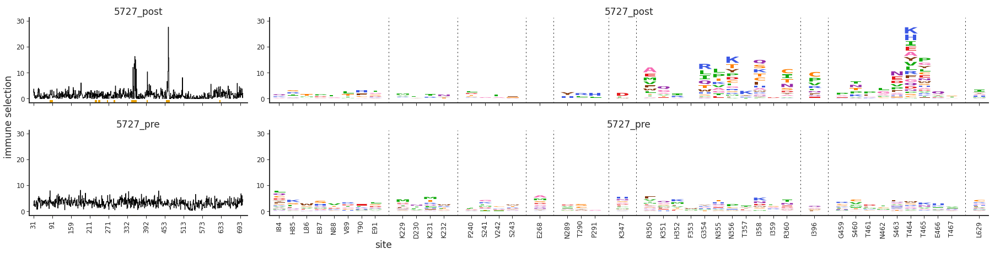

In [78]:
os.makedirs("./results/diffsel/AvgAcrossDils/", exist_ok=True)

for rabbit_id, df in avg_sel_df.groupby('rabbit_id'):

    print(rabbit_id)
    print(rabbit_post_ymax_dict[rabbit_id])
    ymin = -0.055 * rabbit_post_ymax_dict[rabbit_id]
    plotfile = os.path.join("./results/diffsel/AvgAcrossDils/",
                            f"{rabbit_id}.pdf")
    print(f"\n\n{'*' * 72}\nSerum group {rabbit_id}, saving to {plotfile}\n")
    fig, axes = dmslogo.facet_plot(
            data=df,#.query('library == @avg_type'),
            x_col='isite',
            show_col='zoom_site',
            gridrow_col='serum_alldils_name',
            share_xlabel=True,
            share_ylabel=True,
            #share_ylim_across_rows=True,#share_ylim_across_rows[rabbit_id],
            wspace=0.6,
            #fixed_ymax=rabbit_post_ymax_dict[rabbit_id],
            set_ylims = (ymin, rabbit_post_ymax_dict[rabbit_id]),
            draw_line_kwargs=dict(
                    height_col='positive_diffsel',
                    xtick_col='site',
                    ylabel='immune selection',
                    #fixed_ymax=rabbit_post_ymax_dict[rabbit_id],
                    ),
            draw_logo_kwargs=dict(
                    letter_col='mutation',
                    letter_height_col='mutdiffsel',
                    xtick_col='site_label',
                    xlabel='site',
                    ylabel='immune selection',
                    clip_negative_heights=True,
                    #fixed_ymax=rabbit_post_ymax_dict[rabbit_id],
                    ),
            )
    display(fig)
    fig.savefig(plotfile)
    plt.close(fig)



************************************************************************
Serum group 2124_post, saving to ./results/diffsel/AvgAcrossDils_individual/2124_post_NewPNGRed.pdf

2124


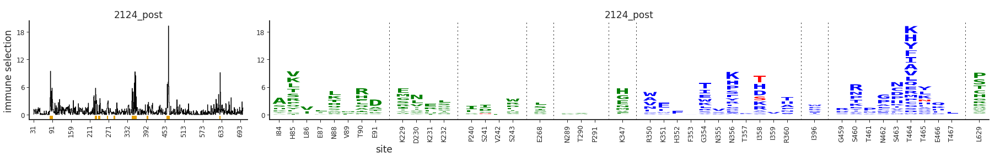



************************************************************************
Serum group 2124_pre, saving to ./results/diffsel/AvgAcrossDils_individual/2124_pre_NewPNGRed.pdf

2124


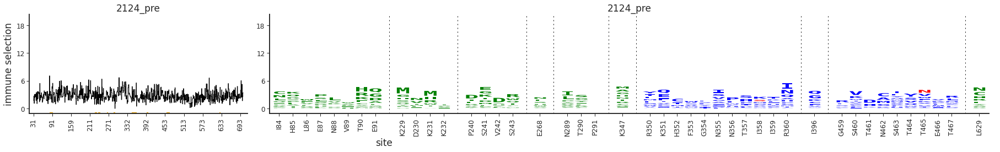



************************************************************************
Serum group 2214_post, saving to ./results/diffsel/AvgAcrossDils_individual/2214_post_NewPNGRed.pdf

2214


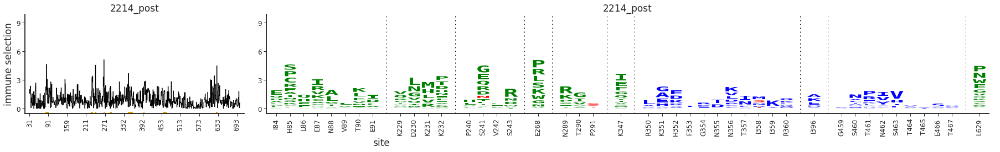



************************************************************************
Serum group 2214_pre, saving to ./results/diffsel/AvgAcrossDils_individual/2214_pre_NewPNGRed.pdf

2214


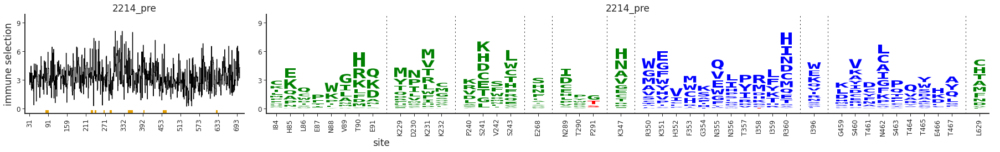



************************************************************************
Serum group 2423_post, saving to ./results/diffsel/AvgAcrossDils_individual/2423_post_NewPNGRed.pdf

2423


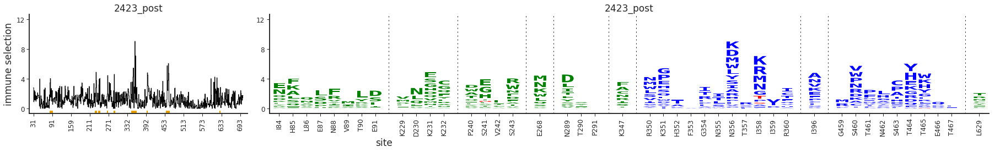



************************************************************************
Serum group 2423_pre, saving to ./results/diffsel/AvgAcrossDils_individual/2423_pre_NewPNGRed.pdf

2423


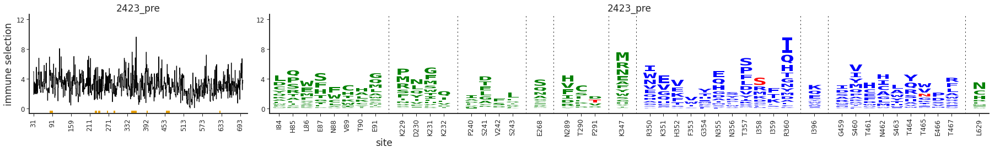



************************************************************************
Serum group 2425_post, saving to ./results/diffsel/AvgAcrossDils_individual/2425_post_NewPNGRed.pdf

2425


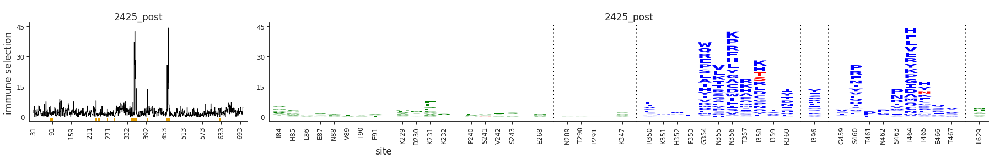



************************************************************************
Serum group 2425_pre, saving to ./results/diffsel/AvgAcrossDils_individual/2425_pre_NewPNGRed.pdf

2425


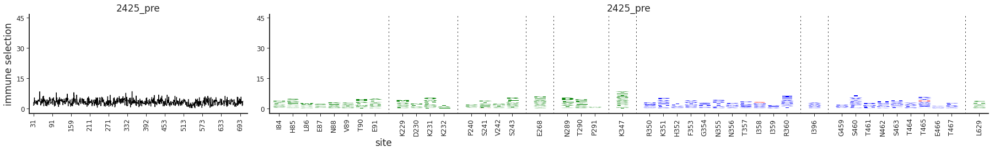



************************************************************************
Serum group 5724_post, saving to ./results/diffsel/AvgAcrossDils_individual/5724_post_NewPNGRed.pdf

5724


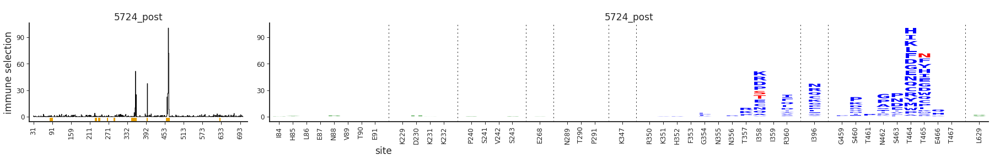



************************************************************************
Serum group 5724_pre, saving to ./results/diffsel/AvgAcrossDils_individual/5724_pre_NewPNGRed.pdf

5724


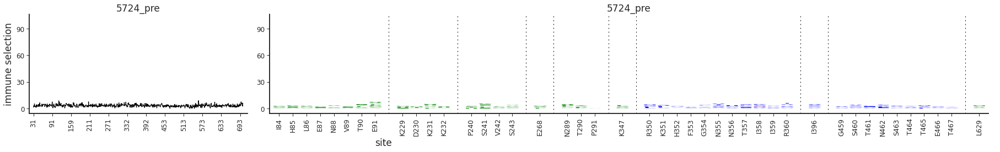



************************************************************************
Serum group 5727_post, saving to ./results/diffsel/AvgAcrossDils_individual/5727_post_NewPNGRed.pdf

5727


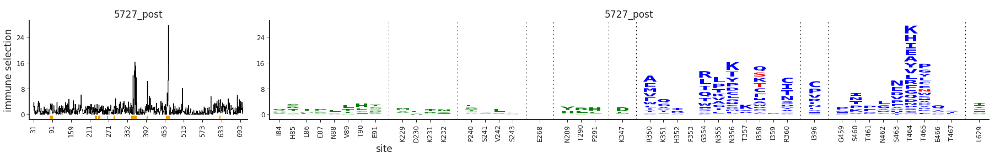



************************************************************************
Serum group 5727_pre, saving to ./results/diffsel/AvgAcrossDils_individual/5727_pre_NewPNGRed.pdf

5727


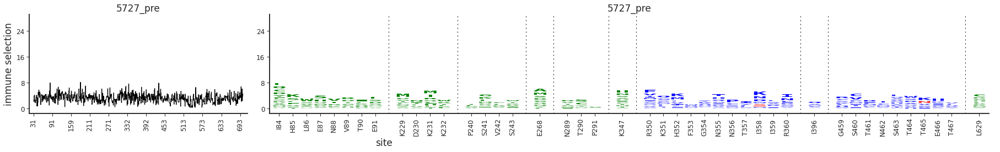

In [79]:
os.makedirs("./results/diffsel/AvgAcrossDils_individual/", exist_ok=True)

for rabbit_id, df in avg_sel_df.groupby('serum_alldils_name'):

    plotfile = os.path.join("./results/diffsel/AvgAcrossDils_individual/",
                            f"{rabbit_id}_NewPNGRed.pdf")
    print(f"\n\n{'*' * 72}\nSerum group {rabbit_id}, saving to {plotfile}\n")
    rabbitname = rabbit_id.split("_")[0]
    ymin = -0.055 * rabbit_post_ymaxx5_dict[rabbitname]
    print(rabbitname)
    fig, axes = dmslogo.facet_plot(
            data=df,#.query('library == @avg_type'),
            #nintiethpercentile
            #ymax= nintiethpercentile * 10
            x_col='isite',
            show_col='zoom_site',
            gridrow_col='serum_alldils_name',
            share_xlabel=True,
            share_ylabel=True,
            #share_ylim_across_rows=rabbit_post_ymax_dict[rabbitname],
            set_ylims = (ymin, rabbit_post_ymaxx5_dict[rabbitname]),
            wspace=0.6,
            draw_line_kwargs=dict(
                    height_col='positive_diffsel',
                    xtick_col='site',
                    ylabel='immune selection',
                    ),
            draw_logo_kwargs=dict(
                    letter_col='mutation',
                    letter_height_col='mutdiffsel',
                    xtick_col='site_label',
                    xlabel='site',
                    ylabel='immune selection',
                    clip_negative_heights=True,
                    color_col='color'
                    ),
            )
    display(fig)
    fig.savefig(plotfile)
    plt.close(fig)

In [80]:
rabbitnames = ['5724', '2425', '5727', '2124', '2423', '2214']
postpdfnamelist = []
for name in rabbitnames:
    postpdfnamelist.append("./results/diffsel/AvgAcrossDils_individual/{0}_post_NewPNGRed.pdf".format(name))
#postpdfnamelist

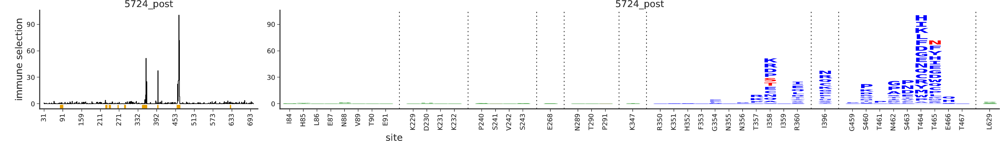

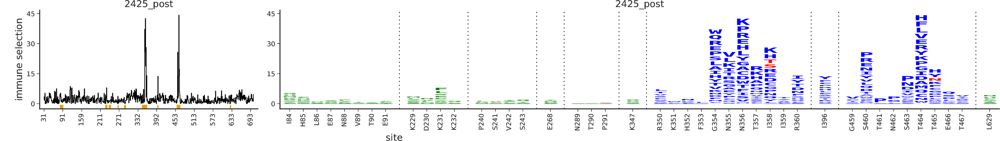

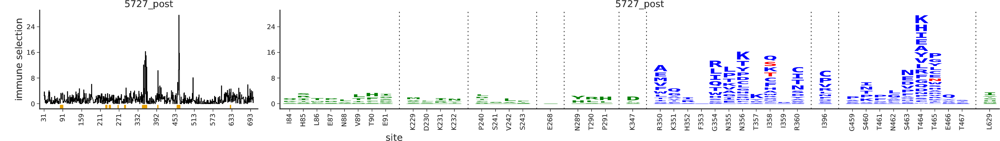

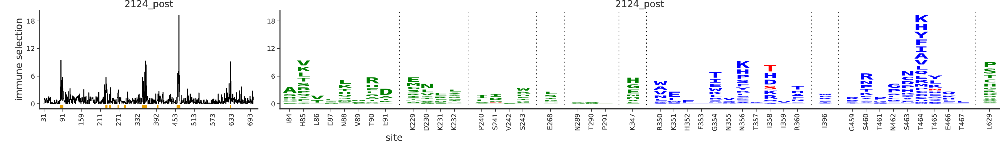

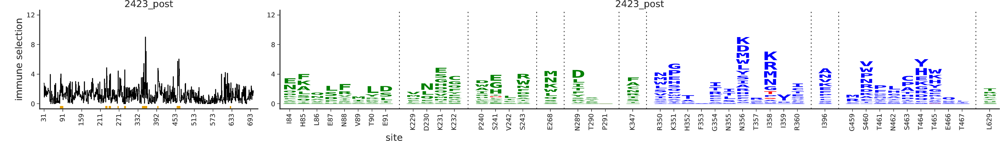

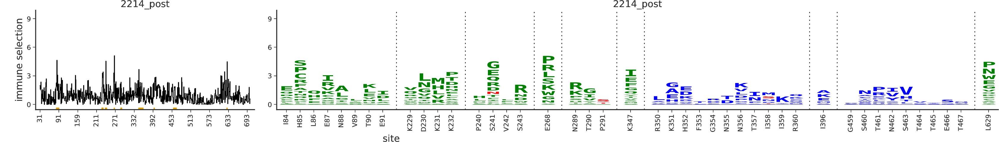

In [81]:
for pdf in postpdfnamelist:
    showPDF(pdf)

In [82]:
#avg_sel_df.head()

In [83]:
avg_sel_df["zoom_siteC3"] = False
avg_sel_df.loc[avg_sel_df['site'].isin(c3465), 'zoom_siteC3'] = True

avg_sel_df["zoom_site241"] = False
avg_sel_df.loc[avg_sel_df['site'].isin(hole241), 'zoom_site241'] = True




************************************************************************
Serum group 2124_post, saving to ./results/diffsel/AvgAcrossDils/C3V5/2124_post.pdf



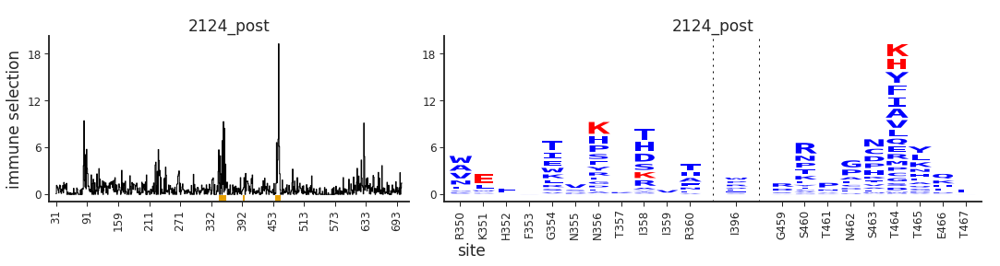



************************************************************************
Serum group 2124_pre, saving to ./results/diffsel/AvgAcrossDils/C3V5/2124_pre.pdf



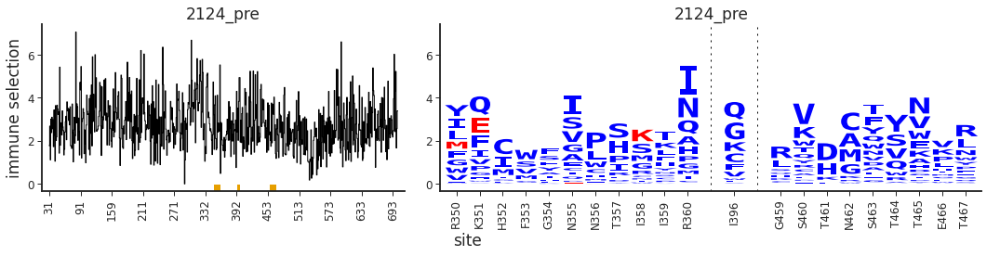



************************************************************************
Serum group 2214_post, saving to ./results/diffsel/AvgAcrossDils/C3V5/2214_post.pdf



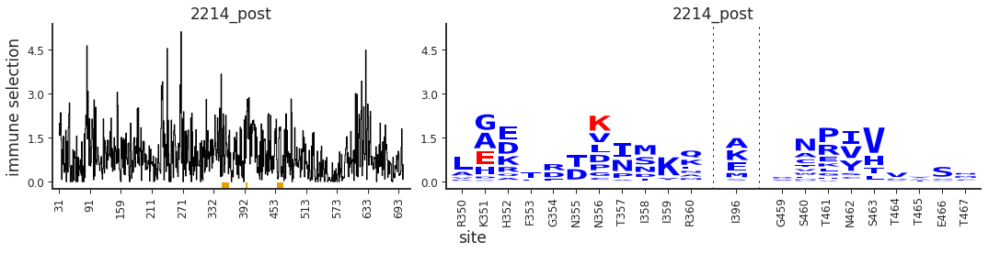



************************************************************************
Serum group 2214_pre, saving to ./results/diffsel/AvgAcrossDils/C3V5/2214_pre.pdf



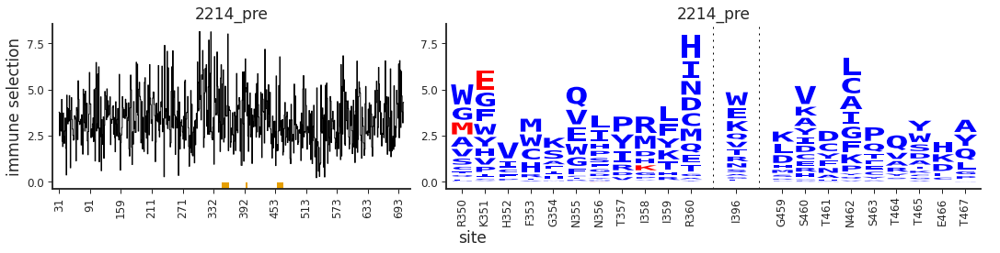



************************************************************************
Serum group 2423_post, saving to ./results/diffsel/AvgAcrossDils/C3V5/2423_post.pdf



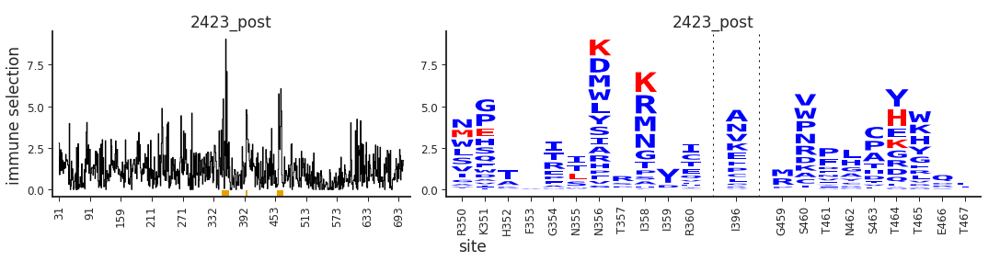



************************************************************************
Serum group 2423_pre, saving to ./results/diffsel/AvgAcrossDils/C3V5/2423_pre.pdf



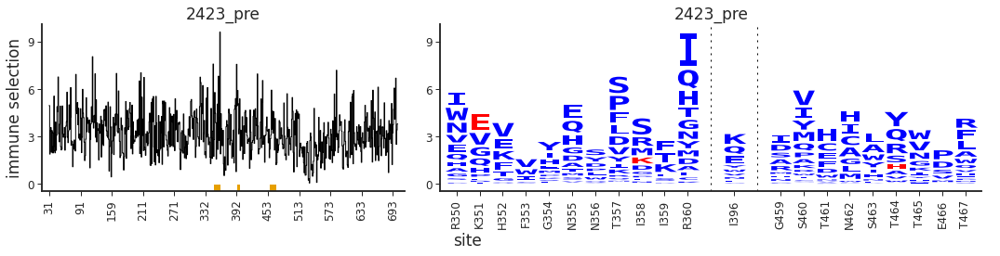



************************************************************************
Serum group 2425_post, saving to ./results/diffsel/AvgAcrossDils/C3V5/2425_post.pdf



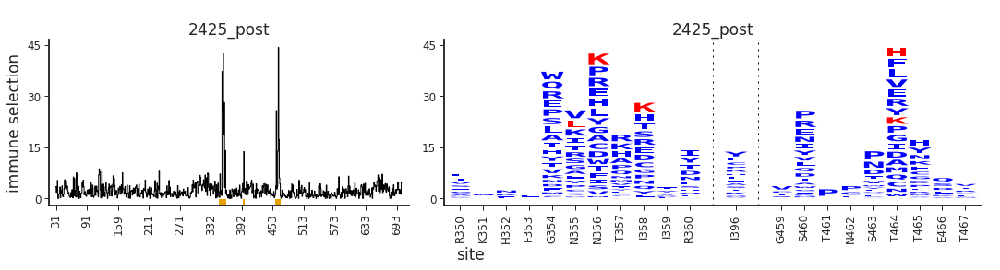



************************************************************************
Serum group 2425_pre, saving to ./results/diffsel/AvgAcrossDils/C3V5/2425_pre.pdf



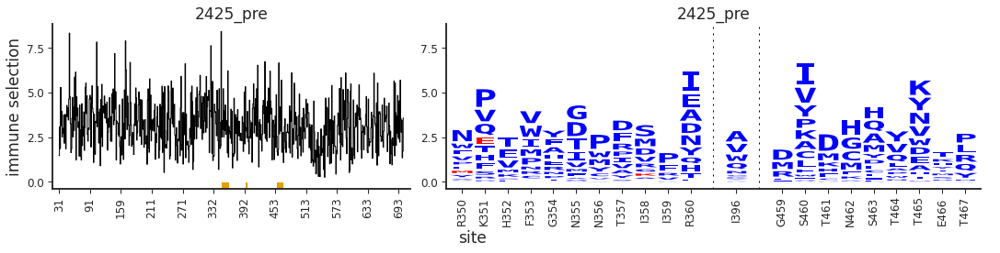



************************************************************************
Serum group 5724_post, saving to ./results/diffsel/AvgAcrossDils/C3V5/5724_post.pdf



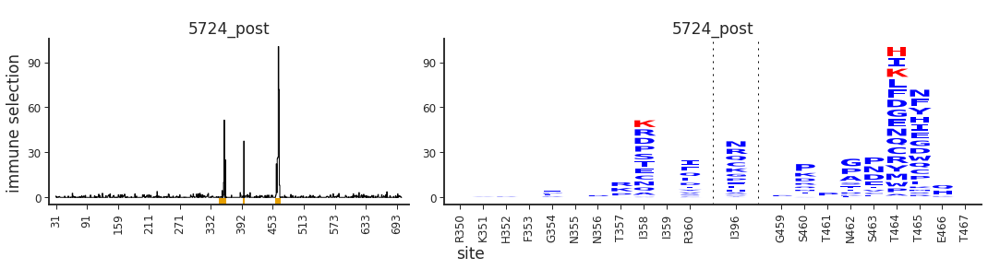



************************************************************************
Serum group 5724_pre, saving to ./results/diffsel/AvgAcrossDils/C3V5/5724_pre.pdf



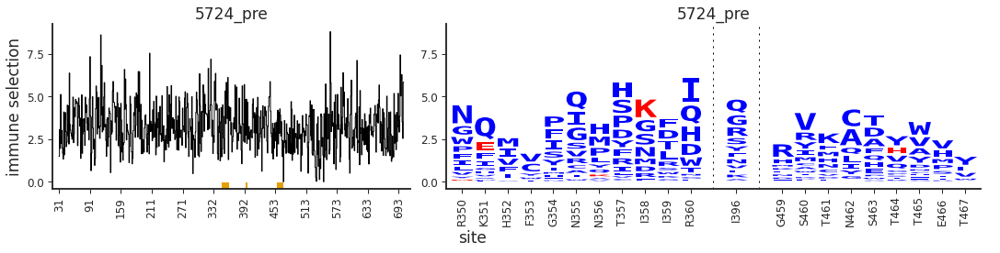



************************************************************************
Serum group 5727_post, saving to ./results/diffsel/AvgAcrossDils/C3V5/5727_post.pdf



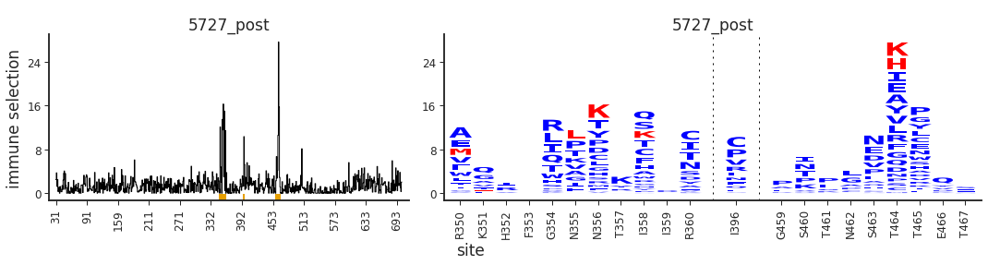



************************************************************************
Serum group 5727_pre, saving to ./results/diffsel/AvgAcrossDils/C3V5/5727_pre.pdf



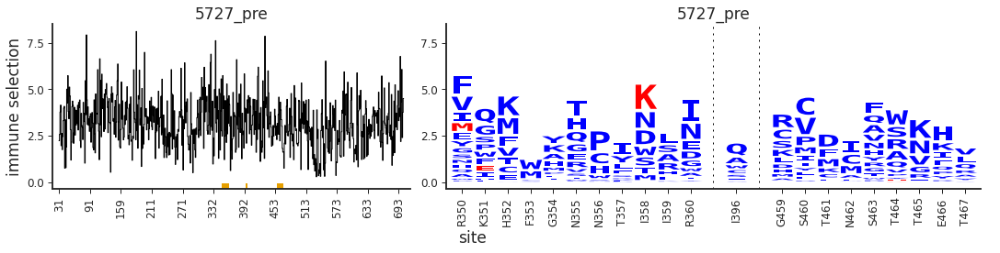

In [84]:
#now we are going to plot only the median values from two samples

os.makedirs("./results/diffsel/AvgAcrossDils/C3V5/", exist_ok=True)

avg_sel_df["color"] = "gray"
avg_sel_df.loc[avg_sel_df['site'].isin(hole241), 'color'] = "green"
avg_sel_df.loc[avg_sel_df['site'].isin(c3465), 'color'] = "blue"

avg_sel_df.loc[(avg_sel_df['site_label'] == "K351") & (avg_sel_df['mutation'] == "E"), 'color'] = "red"
avg_sel_df.loc[(avg_sel_df['site_label'] == "N355") & (avg_sel_df['mutation'] == "L"), 'color'] = "red"
avg_sel_df.loc[(avg_sel_df['site_label'] == "R350") & (avg_sel_df['mutation'] == "M"), 'color'] = "red"
avg_sel_df.loc[(avg_sel_df['site_label'] == "N356") & (avg_sel_df['mutation'] == "K"), 'color'] = "red"
avg_sel_df.loc[(avg_sel_df['site_label'] == "T464") & (avg_sel_df['mutation'] == "H"), 'color'] = "red"
avg_sel_df.loc[(avg_sel_df['site_label'] == "T464") & (avg_sel_df['mutation'] == "K"), 'color'] = "red"
avg_sel_df.loc[(avg_sel_df['site_label'] == "I358") & (avg_sel_df['mutation'] == "K"), 'color'] = "red"


for rabbit_id, df in avg_sel_df.groupby('serum_alldils_name'):

    plotfile = os.path.join("./results/diffsel/AvgAcrossDils/C3V5/",
                            f"{rabbit_id}.pdf")
    print(f"\n\n{'*' * 72}\nSerum group {rabbit_id}, saving to {plotfile}\n")
    fig, axes = dmslogo.facet_plot(
            data=df,#.query('library == @avg_type'),
            x_col='isite',
            show_col='zoom_siteC3',
            gridrow_col='serum_alldils_name',
            share_xlabel=True,
            share_ylabel=True,
            #share_ylim_across_rows=share_ylim_across_rows[rabbit_id],
            wspace=0.6,
            draw_line_kwargs=dict(
                    height_col='positive_diffsel',
                    xtick_col='site',
                    ylabel='immune selection',
                    ),
            draw_logo_kwargs=dict(
                    letter_col='mutation',
                    letter_height_col='mutdiffsel',
                    xtick_col='site_label',
                    xlabel='site',
                    ylabel='immune selection',
                    clip_negative_heights=True,
                    color_col='color',
                    ),
            )
    display(fig)
    fig.savefig(plotfile)
    plt.close(fig)




************************************************************************
Serum group 2124_post, saving to ./results/diffsel/AvgAcrossDils/241/2124_post.pdf



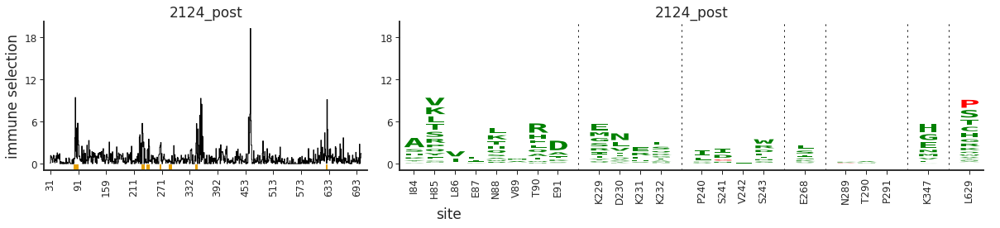



************************************************************************
Serum group 2124_pre, saving to ./results/diffsel/AvgAcrossDils/241/2124_pre.pdf



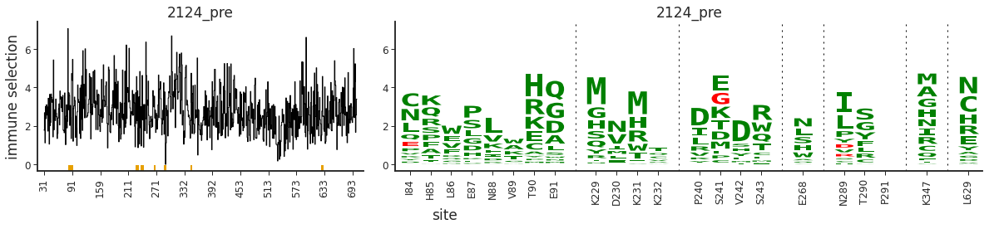



************************************************************************
Serum group 2214_post, saving to ./results/diffsel/AvgAcrossDils/241/2214_post.pdf



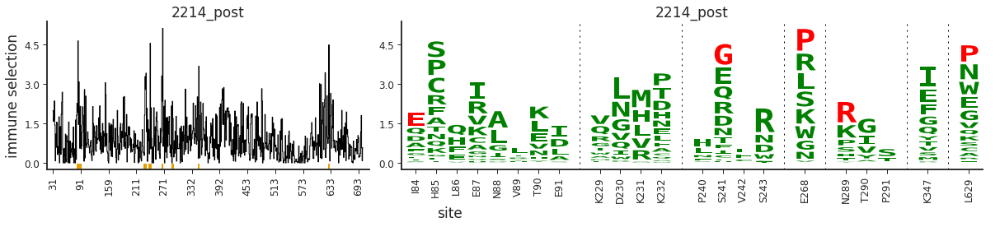



************************************************************************
Serum group 2214_pre, saving to ./results/diffsel/AvgAcrossDils/241/2214_pre.pdf



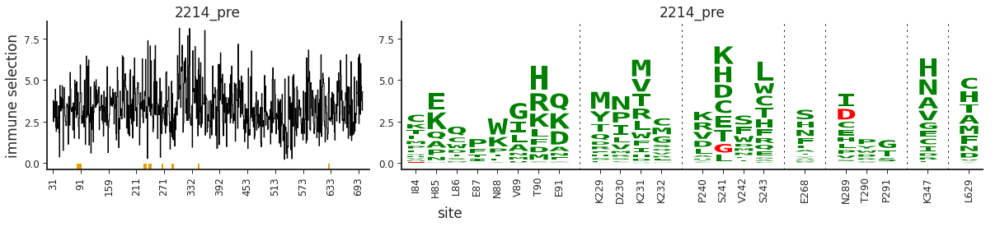



************************************************************************
Serum group 2423_post, saving to ./results/diffsel/AvgAcrossDils/241/2423_post.pdf



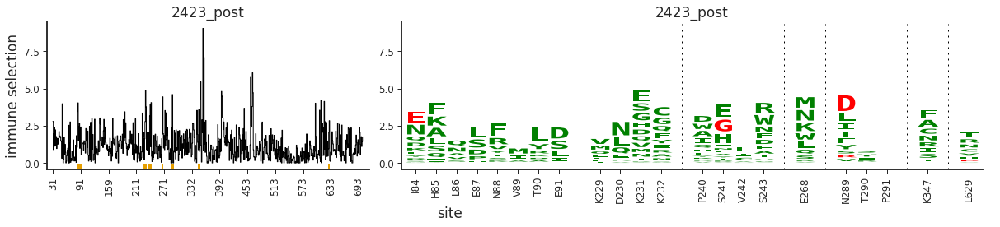



************************************************************************
Serum group 2423_pre, saving to ./results/diffsel/AvgAcrossDils/241/2423_pre.pdf



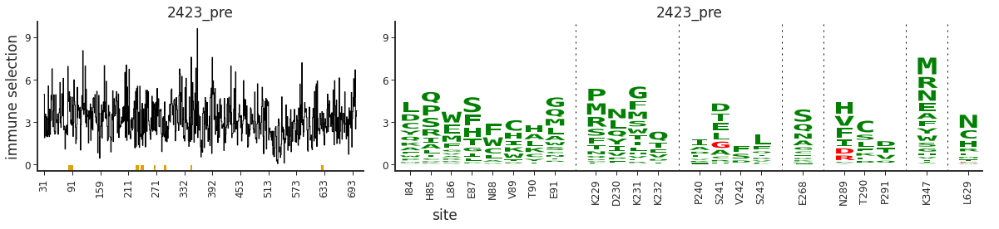



************************************************************************
Serum group 2425_post, saving to ./results/diffsel/AvgAcrossDils/241/2425_post.pdf



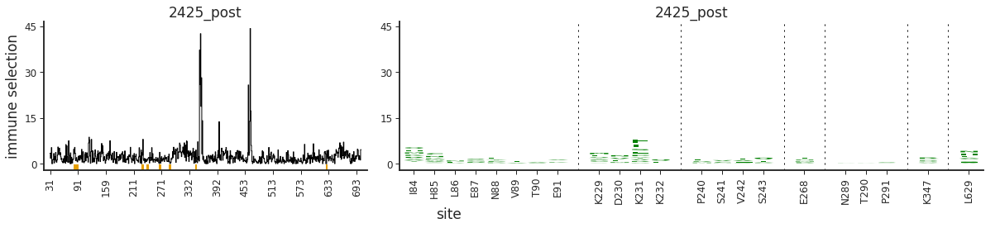



************************************************************************
Serum group 2425_pre, saving to ./results/diffsel/AvgAcrossDils/241/2425_pre.pdf



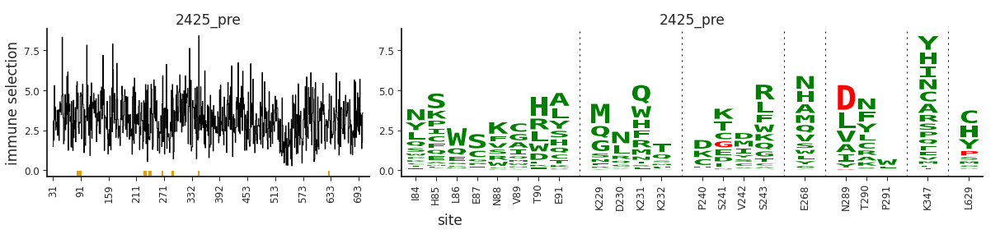



************************************************************************
Serum group 5724_post, saving to ./results/diffsel/AvgAcrossDils/241/5724_post.pdf



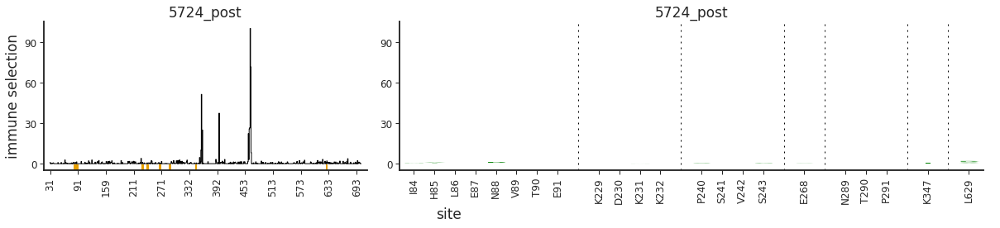



************************************************************************
Serum group 5724_pre, saving to ./results/diffsel/AvgAcrossDils/241/5724_pre.pdf



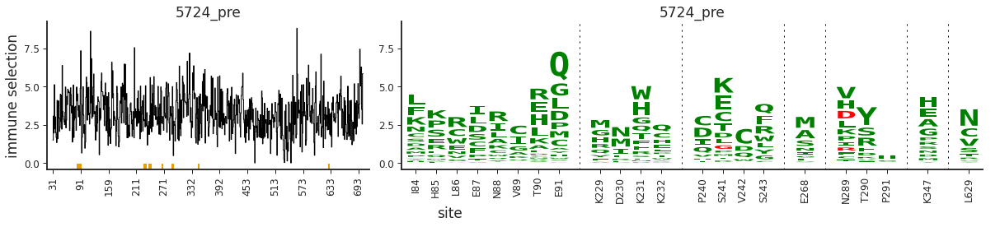



************************************************************************
Serum group 5727_post, saving to ./results/diffsel/AvgAcrossDils/241/5727_post.pdf



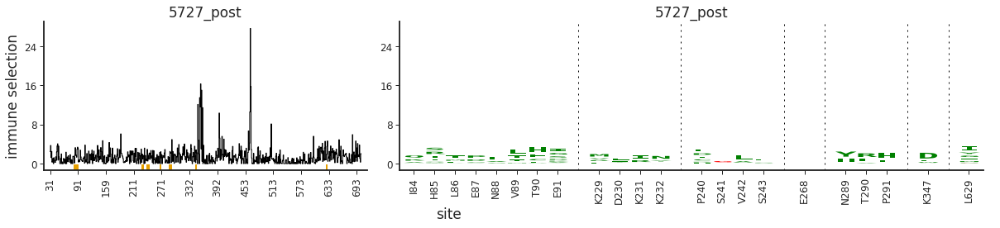



************************************************************************
Serum group 5727_pre, saving to ./results/diffsel/AvgAcrossDils/241/5727_pre.pdf



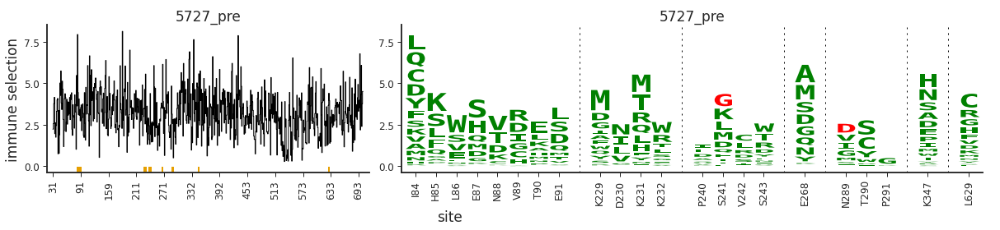

In [85]:

os.makedirs("./results/diffsel/AvgAcrossDils/241/", exist_ok=True)

avg_sel_df["color"] = "gray"
avg_sel_df.loc[avg_sel_df['site'].isin(hole241), 'color'] = "green"
avg_sel_df.loc[avg_sel_df['site'].isin(c3465), 'color'] = "blue"

avg_sel_df.loc[(avg_sel_df['site_label'] == "I84") & (avg_sel_df['mutation'] == "E"), 'color'] = "red"
avg_sel_df.loc[(avg_sel_df['site_label'] == "N289") & (avg_sel_df['mutation'] == "D"), 'color'] = "red"
avg_sel_df.loc[(avg_sel_df['site_label'] == "L629") & (avg_sel_df['mutation'] == "P"), 'color'] = "red"
avg_sel_df.loc[(avg_sel_df['site_label'] == "N289") & (avg_sel_df['mutation'] == "R"), 'color'] = "red"
avg_sel_df.loc[(avg_sel_df['site_label'] == "T464") & (avg_sel_df['mutation'] == "H"), 'color'] = "red"
avg_sel_df.loc[(avg_sel_df['site_label'] == "S241") & (avg_sel_df['mutation'] == "G"), 'color'] = "red"
avg_sel_df.loc[(avg_sel_df['site_label'] == "E268") & (avg_sel_df['mutation'] == "P"), 'color'] = "red"



for rabbit_id, df in avg_sel_df.groupby('serum_alldils_name'):

    plotfile = os.path.join("./results/diffsel/AvgAcrossDils/241/",
                            f"{rabbit_id}.pdf")
    print(f"\n\n{'*' * 72}\nSerum group {rabbit_id}, saving to {plotfile}\n")
    fig, axes = dmslogo.facet_plot(
            data=df,#.query('library == @avg_type'),
            x_col='isite',
            show_col='zoom_site241',
            gridrow_col='serum_alldils_name',
            share_xlabel=True,
            share_ylabel=True,
            #share_ylim_across_rows=share_ylim_across_rows[rabbit_id],
            wspace=0.6,
            draw_line_kwargs=dict(
                    height_col='positive_diffsel',
                    xtick_col='site',
                    ylabel='immune selection',
                    ),
            draw_logo_kwargs=dict(
                    letter_col='mutation',
                    letter_height_col='mutdiffsel',
                    xtick_col='site_label',
                    xlabel='site',
                    ylabel='immune selection',
                    clip_negative_heights=True,
                    color_col='color',
                    ),
            )
    display(fig)
    fig.savefig(plotfile)
    plt.close(fig)

## Map differential selection onto structure

In [86]:
from colour import Color
import pandas as pd
import pandas as pd
from io import StringIO
colors = ('#fafafa', '#ff0000')
def MapDiffselColorToSite_15(diffselfile, scriptfile, script_type='pymol', 
                          map_type='abs_diffsel', colors = colors, sitecolorfile=None,
                          script_preamble=False, restrict_to_chain=False, script_postamble=False, abname=None):
    '''Produces a colormapping based on differential selection and writes a script for `pymol` or `chimera`
    to color a structure by this colormapping.
    
    Uses the data in *diffselfile*, which can be either a mutdiffsel or a sitediffsel file, 
    depending on the specified *map_type*. 
    
    Writes a python script to *scriptfile* for the molecular visualization program specified 
    in *script_type* (either `pymol` or `chimera`).
    
    *colors* is a list of two colors defined by hex or r,g,b codes.
    
    How the mapping from differential selection to color is determined is specified by the 
    following choices for *map_type*:
    
        * `abs_diffsel`: plot total absolute differential selection at each site. 
        Total absolute differential selection will be converted to color by interpolating between 
        the two *colors*, which will be used to show the minimum and maximum values, respectively.
        Requries *diffselfile* to be a '*sitediffsel.txt' file.
        
        * `positive_diffsel`: plot the absolute positive selection at each site. 
        Absolute positive differential selection will be converted to color by interpolating between 
        the two *colors*, which will be used to show the minimum and maximum values, respectively.
        Requries *diffselfile* to be a '*sitediffsel.txt' file.
        
        * `negative_diffsel`: plot the absolute negative selection at each site. 
        Absolute negative differential selection will be converted to color by interpolating between 
        the two *colors*, which will be used to show the (absolute) minimum and maximum values, respectively.
        Requries *diffselfile* to be a '*sitediffsel.txt' file.
        
        * `max_pos_mutdiffsel`: plot the maximum positive mutdiffsel at each site (the value for the most 
        strongly enriched mutation at each site).
        Requries *diffselfile* to be a '*mutdiffsel.txt' file.
    
    If you want to restrict the recoloring to a single chain, specify the name of the chain to color to *restrict_to_chain*.
        
    Optionally, provide a path for a *sitecolorfile* to which the (site, hexcolor, rgbcolor) mappings are
    written.
    
    Optionally, if a *script_preamble* is provided, it is written to the top of the script before the 
    commands for colormapping. This may be a useful place to add other pymol or chimera commands to load 
    the pdb file, orient the view, etc.
    '''

    # read in the data from the diffselfile:
    df = pd.read_csv(diffselfile)
    df = df.dropna()
    
    #drop rows that are insertions relative to HXB2. This is not ideal, but done to ensure the coloring script works. note insertions relative to HXB2 in the sturcture are not colored according to diffsel metrics.
    
    df = df[df.site.apply(lambda x: x.isnumeric())]
    column_names = list(df)
   
    if column_names == ['site', 'wildtype', 'mutation', 'mutdiffsel'] or column_names == ['site', 'wildtype', 'mutation', 'mutfracsurvive']:
        filetype = 'mutdiffsel'
    elif column_names == ['site', 'abs_diffsel', 'positive_diffsel', 'negative_diffsel', 'max_diffsel', 'min_diffsel']:
        filetype = 'sitediffsel' 
    else:

        raise ValueError('diffsel file does not have appropriate set of column identifiers for {0}'.format(column_names))
    
    # establish the color spectrum in hex and rgb.
    n_subdivisions = 500 # the color spectrum will be divided into this many discrete colors
    color1 = Color(colors[0])
    color2 = Color(colors[1])
    hex_spectrum = [c.hex for c in color1.range_to(color2, n_subdivisions)]
    hex_spectrum_dict = dict([(i, hex_spectrum[i]) for i in range(len(hex_spectrum))]) 
    rgb_spectrum = [c.rgb for c in color1.range_to(color2, n_subdivisions)]
    rgb_spectrum_dict = dict([(i, rgb_spectrum[i]) for i in range(len(rgb_spectrum))])
    
    # generate the site ==> colorindex mapping based on *map_type*:
    if map_type == 'abs_diffsel':
        assert filetype == 'sitediffsel'
        min_diff = df.min()['abs_diffsel']  
        max_diff = df.max()['abs_diffsel']  # the min and max will be mapped to color1 and color2, respectively
        range_diff = max_diff - min_diff
        df['colorindex'] =  (df.abs_diffsel - min_diff)/range_diff*(n_subdivisions-1)
        
    elif map_type == 'negative_diffsel':
        assert filetype == 'sitediffsel'
        abs_neg_col = abs(df['negative_diffsel'])
        df = df.assign(abs_neg=abs_neg_col)
        min_diff = df.min()['abs_neg']  
        max_diff = df.max()['abs_neg']  # the min and max will be mapped to color1 and color2, respectively
        range_diff = max_diff - min_diff
        df['colorindex'] =  (df.abs_neg - min_diff)/range_diff*(n_subdivisions-1)
            
    elif map_type == 'positive_diffsel':
        assert filetype == 'sitediffsel'
        abs_pos_col = abs(df['positive_diffsel'])
        df = df.assign(abs_pos=abs_pos_col)
        #df = df.append({'site' : '0' , 'abs_pos' : 15} , ignore_index=True) #this is added to standardize color scheme across all samples
        df['positive_diffsel'] = df['positive_diffsel'].clip(upper=15) #clip everything above 15 to 15 
        min_diff = df.min()['abs_pos']  
        max_diff = df.max()['abs_pos']  # the min and max will be mapped to color1 and color2, respectively
        range_diff = max_diff - min_diff
        df['colorindex'] =  (df.abs_pos - min_diff)/range_diff*(n_subdivisions-1)
    
    elif map_type == 'max_pos_mutdiffsel':
        assert filetype == 'mutdiffsel'
        # sort mutdiffsel file by diffsel in case it wasn't already:
        df.sort_values('mutdiffsel', ascending=False, inplace=True)
        # a new dataframe to only store the max mutdiffsel from each site
        newdf = pd.DataFrame(columns=['site', 'wildtype', 'mutation', 'mutdiffsel']) 
        for row in df.itertuples():
            if not any(newdf['site'].astype(int) == int(row[1])):
                newdf = newdf.append(pd.DataFrame([row[1:]], columns = ['site', 'wildtype', 'mutation', 'mutdiffsel']))
        
        newdf['site'] = newdf['site'].apply(int)
        
        
        # replace negative values with zero at sites where there was no positive selection:
        #newdf = newdf.clip(lower=0) #old
        newdf['site'] = newdf['site'].clip(lower=0) #new
        min_diff = newdf.min()['mutdiffsel']  
        max_diff = newdf.max()['mutdiffsel']  # the min and max will be mapped to color1 and color2, respectively
        range_diff = max_diff - min_diff
        newdf['colorindex'] =  (newdf.mutdiffsel - min_diff)/range_diff*(n_subdivisions-1)
        df = newdf

    else:
        raise ValueError("%s is not a recognized map_type." % map_type)
        
    # add a column for colors for each site
    df['colorindex'] = df['colorindex'].astype(int) # round to nearest index
    df['hex'] = df['colorindex'].map(hex_spectrum_dict)
    df['rgb'] = df['colorindex'].map(rgb_spectrum_dict)        
    site_color_mapping = pd.concat([df['site'], df['hex'], df['rgb']], axis=1)
    
    if sitecolorfile:
        site_color_mapping.to_csv(sitecolorfile, index=False)
    
    # write out the script to *scriptfile*:
    f = open(scriptfile, 'w')
    
    if script_preamble:
        preamblef = open(script_preamble, 'r')
        for line in preamblef:
            f.write(line)
    
    if script_type == 'chimera':
        f.write("from chimera import runCommand\n")
        for i in range(len(df.index)):
            f.write("runCommand(color %s :%s)" % (site_color_mapping.iloc[i]['hex'], site_color_mapping.iloc[i]['site']) )
    elif script_type == 'pymol':
        for i in range(len(df.index)):
            rgblist = [min(1, c) for c in site_color_mapping.iloc[i]['rgb']]
            f.write("cmd.set_color(\'color%s\', \'%s\')\n" % (site_color_mapping.iloc[i]['site'], rgblist))
            if restrict_to_chain:
                f.write("cmd.color(\'color%s\', \'chain %s and resi %s\')\n" % (site_color_mapping.iloc[i]['site'], restrict_to_chain, site_color_mapping.iloc[i]['site']))
            else:
                f.write("cmd.color(\'color%s\', \'resi %s\')\n" % (site_color_mapping.iloc[i]['site'], site_color_mapping.iloc[i]['site']))
    else:
        raise ValueError("script_type must be chimera or pymol.")
    
    if script_postamble:
        postamblef = open(script_postamble, 'r')
        f.write('abname = "{0}"'.format(abname))
        for line in postamblef:
            f.write(line)
    
    f.close()

In [87]:
pymoldir = "./results/diffsel/pymol/"
if not os.path.isdir(pymoldir):
    os.mkdir(pymoldir)

In [88]:
for ab in mediansiteselfiledict:
    mutdiffselfile= medianmutselfiledict[ab]
    scriptfile= './results/diffsel/pymol/median-max15-{0}-ColorMaxPositive.py'.format(ab)
    #MapDiffselColorToSite(mutdiffselfile, scriptfile, script_type='pymol', map_type='max_pos_mutdiffsel')
    
    sitediffselfile= mediansiteselfiledict[ab] #'./results/diffsel/median-{0}_sitediffsel.csv'.format(ab)

    scriptfile= './results/diffsel/pymol/median-max15-{0}-ColorPositiveDiff.py'.format(ab)
    MapDiffselColorToSite_15(sitediffselfile, scriptfile, script_type='pymol', map_type='positive_diffsel', abname=ab, script_preamble="./data/5YFL_general_preamble.txt", script_postamble="./data/5YFL_general_postamble.txt")
    
    scriptfile= './results/diffsel/pymol/median-max15-{0}-nopreamble-ColorPositiveDiff.py'.format(ab)
    MapDiffselColorToSite_15(sitediffselfile, scriptfile, script_type='pymol', map_type='positive_diffsel', abname=ab)

    scriptfile= './results/diffsel/pymol/median-max15-{0}-241pic-ColorPositiveDiff.py'.format(ab)
    MapDiffselColorToSite_15(sitediffselfile, scriptfile, script_type='pymol', map_type='positive_diffsel', abname=ab, script_preamble="./data/5YFL_monomer_preamble.txt", script_postamble="./data/5YFL_241hole_postamble.txt")
    
    
    scriptfile= './results/diffsel/pymol/median-max15-{0}-C3465pic-ColorPositiveDiff.py'.format(ab)
    MapDiffselColorToSite_15(sitediffselfile, scriptfile, script_type='pymol', map_type='positive_diffsel', abname=ab, script_preamble="./data/5YFL_monomer_preamble.txt", script_postamble="./data/5YFL_c3465_postamble1.txt")

    scriptfile= './results/diffsel/pymol/median-max15-{0}-C3465picZOOM-ColorPositiveDiff.py'.format(ab)
    MapDiffselColorToSite_15(sitediffselfile, scriptfile, script_type='pymol', map_type='positive_diffsel', abname=ab, script_preamble="./data/5YFL_monomer_preamble.txt", script_postamble="./data/5YFL_c3465Zoom_postamble1.txt")

    
    
    scriptfile= './results/diffsel/pymol/median-max15-{0}-ColorPositiveDiff_view2.py'.format(ab)
    #MapDiffselColorToSite(sitediffselfile, scriptfile, script_type='pymol', map_type='positive_diffsel', abname=ab, script_preamble="./data/5YFL_general_preamble.txt", script_postamble="./data/5YFL_general_postamble2.txt")

    
    scriptfile= './results/diffsel/pymol/median-{0}-ColorAbsDiff.py'.format(ab)
    #MapDiffselColorToSite(sitediffselfile, scriptfile, script_type='pymol', map_type='abs_diffsel')
    scriptfile= './results/diffsel/pymol/median-{0}-ColorNegDiff.py'.format(ab)
    #MapDiffselColorToSite(sitediffselfile, scriptfile, script_type='pymol', map_type='negative_diffsel')